In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree

In [31]:
data = pd.read_csv("unemployment analysis.csv")
data.head(10)

,Country Name,Country Code,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Africa Eastern and Southern,AFE,7.797012,7.838142,7.849445,7.839701,7.833286,7.841857,7.858703,7.810903,7.789680,7.724844,7.732945,7.959582,7.787965,7.310328,7.117658,6.989477,6.738765,6.271977,6.323909,6.867786,6.748081,6.562179,6.445456,6.405195,6.490041,6.610205,6.714955,6.731163,6.914353,7.563187,8.111735
1,Afghanistan,AFG,10.649000,10.821000,10.723000,10.726000,11.179000,10.962000,10.783000,10.802000,10.809000,10.806000,10.809000,11.257000,11.141000,10.988000,11.217000,11.099000,11.301000,11.093000,11.311000,11.352000,11.054000,11.341000,11.193000,11.142000,11.127000,11.158000,11.180000,11.152000,11.217000,11.710000,13.283000
2,Africa Western and Central,AFW,4.415455,4.530574,4.546265,4.539152,4.525745,4.566774,4.602367,4.662650,4.863700,4.921423,4.865752,4.781385,4.751168,4.731880,4.727947,4.648872,4.627661,4.599393,4.583291,4.554662,4.548376,4.637602,4.410216,4.688088,4.626737,5.567017,6.019505,6.041092,6.063362,6.774914,6.838999
3,Angola,AGO,4.208000,4.208000,4.231000,4.162000,4.114000,4.097000,4.088000,4.072000,4.055000,4.030000,4.004000,3.961000,3.958000,3.916000,3.882000,3.858000,3.821000,3.793000,3.780000,9.430000,7.360000,7.347000,7.366000,7.372000,7.392000,7.412000,7.408000,7.421000,7.421000,8.333000,8.530000
4,Albania,ALB,10.307000,30.014999,25.257999,20.840000,14.611000,13.931000,16.875999,20.047001,20.840000,19.028000,18.575001,17.895000,16.989000,16.309999,15.970000,15.630000,15.970000,13.060000,13.670000,14.090000,13.480000,13.380000,15.870000,18.049999,17.190001,15.420000,13.620000,12.300000,11.470000,13.329000,11.819000
5,Arab World,ARB,11.624660,12.123597,12.859821,12.949263,13.317197,12.382483,11.948039,11.969959,12.109096,12.596101,12.469380,12.465001,12.390521,11.352673,11.195937,10.425838,10.027224,9.724742,9.329220,9.400912,10.476673,10.663129,10.735393,10.872227,10.965901,10.761115,10.896379,10.502336,10.006154,11.487321,11.625532
6,United Arab Emirates,ARE,1.866000,1.842000,1.849000,1.806000,1.800000,1.900000,1.980000,2.137000,2.216000,2.250000,2.493000,2.648000,2.751000,2.907000,3.120000,2.937000,2.872000,2.737000,2.679000,2.481000,2.302000,2.185000,2.044000,1.911000,1.768000,1.640000,2.460000,2.352000,2.230000,3.188000,3.358000
7,Argentina,ARG,5.440000,6.360000,10.100000,11.760000,18.799999,17.110001,14.820000,12.650000,14.050000,15.000000,17.320000,19.590000,15.360000,13.520000,11.510000,10.080000,8.470000,7.840000,8.650000,7.710000,7.180000,7.220000,7.100000,7.270000,7.521000,8.111000,8.350000,9.220000,9.840000,11.460000,10.902000
8,Armenia,ARM,1.600000,1.800000,5.300000,6.600000,6.700000,9.300000,10.800000,9.400000,11.200000,11.048000,10.912000,10.776000,10.594000,10.344000,10.203000,9.997000,9.810000,14.393000,18.440001,19.010000,18.440001,17.299999,16.180000,17.500000,18.260000,17.620001,17.700001,18.969999,18.299999,21.205999,20.896999
9,Australia,AUS,9.580000,10.730000,10.870000,9.720000,8.470000,8.510000,8.360000,7.680000,6.870000,6.280000,6.740000,6.370000,5.930000,5.390000,5.030000,4.780000,4.380000,4.230000,5.560000,5.210000,5.080000,5.220000,5.660000,6.080000,6.050000,5.710000,5.590000,5.300000,5.160000,6.460000,5.112000


In [32]:
data.drop(columns=["Country Code"], inplace=True)

----------- Showing Result of : 1991 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Rwanda,Belarus,Pakistan,Chad,Cambodia,Myanmar,Qatar,Kuwait,Maldives,Kazakhstan,Azerbaijan,Uganda,Kyrgyz Republic,Bahrain,Lithuania,Tonga,Solomon Islands,Niger,Turkmenistan,Bhutan,Estonia,Luxembourg,Benin,Burundi,Armenia,Vanuatu,Nepal,Switzerland,"Hong Kong SAR, China",United Arab Emirates,Moldova,Tajikistan,Uzbekistan,Ukraine,Vietnam,Japan,Samoa,Singapore,Bangladesh,Liberia,Czechia,"Korea, Dem. People's Rep.",China,East Asia & Pacific (excluding high income),East Asia & Pacific (IDA & IBRD countries),"Korea, Rep.",East Asia & Pacific,Lao PDR,Papua New Guinea,Iceland,Burkina Faso,Guatemala,Indonesia,Thailand,Georgia,Latvia,Mozambique,Pacific island small states,"Congo, Dem. Rep.",Bolivia,Cyprus,"Macao SAR, China",IDA blend,Ethiopia,Kenya,Mexico,Sweden,Austria,Sierra Leone,Ghana,Guam,Mali,Timor-Leste,Tanzania,Late-demographic dividend,Malaysia,Togo,IDA total,Panama,Philippines,Upper middle income,Least developed countries: UN classification,Portugal,IDA only,Oman,Fiji,Nigeria,Angola,Middle income,Low & middle income,Ecuador,IDA & IBRD total,Africa Western and Central,Guinea,IBRD only,Peru,Honduras,Fragile and conflict affected situations,Brunei Darussalam,Lower middle income,Low income,World,Heavily indebted poor countries (HIPC),Zimbabwe,Madagascar,Europe & Central Asia (excluding high income),South Asia,South Asia (IDA & IBRD),Paraguay,Comoros,Pre-demographic dividend,Chile,Eritrea,Germany,Early-demographic dividend,Costa Rica,Russian Federation,Norway,Argentina,Senegal,India,Malawi,Central African Republic,Latin America & Caribbean (excluding high income),Channel Islands,Europe & Central Asia (IDA & IBRD countries),Latin America & the Caribbean (IDA & IBRD coun...,Latin America & Caribbean,Malta,Guinea-Bissau,Post-demographic dividend,Brazil,Dominican Republic,Mongolia,Finland,Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa (excluding high income),Sub-Saharan Africa,Cote d'Ivoire,High income,Syrian Arab Republic,OECD members,United States,Europe & Central Asia,Nicaragua,Belgium,Saudi Arabia,Slovenia,North America,Netherlands,Cameroon,Haiti,El Salvador,Greece,Africa Eastern and Southern,Cuba,Romania,Equatorial Guinea,Turkiye,Euro area,"Yemen, Rep.",Lebanon,Hungary,European Union,United Kingdom,"Gambia, The",Uruguay,Denmark,France,Iraq,Central Europe and the Baltics,"Egypt, Arab Rep.","Venezuela, RB",Australia,Mauritius,Belize,Mauritania,Italy,Colombia,Albania,Canada,New Zealand,Afghanistan,Bulgaria,"Iran, Islamic Rep.",Middle East & North Africa,Croatia,Cabo Verde,Slovak Republic,West Bank and Gaza,Arab World,Other small states,Middle East & North Africa (excluding high inc...,Middle East & North Africa (IDA & IBRD countries),South Sudan,Guyana,French Polynesia,"Bahamas, The",Small states,Virgin Islands (U.S.),Morocco,Poland,Serbia,Israel,Botswana,Sao Tome and Principe,Sri Lanka,Sudan,Tunisia,Jamaica,Ireland,Spain,Caribbean small states,Puerto Rico,St. Lucia,Suriname,Bosnia and Herzegovina,Gabon,New Caledonia,Trinidad and Tobago,Zambia,Namibia,Somalia,Jordan,St. Vincent and the Grenadines,Libya,"Congo, Rep.",Algeria,Eswatini,Barbados,North Macedonia,Montenegro,Djibouti,South Africa,

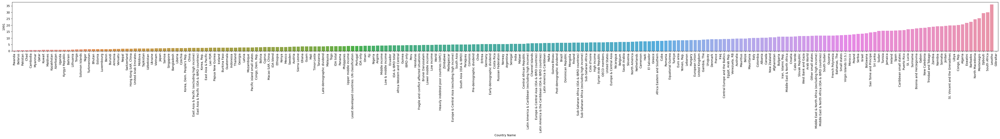

----------- Showing Result of : 1992 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Rwanda,Pakistan,Myanmar,Chad,Cambodia,Kuwait,Qatar,Maldives,Uganda,Kazakhstan,Bahrain,Kyrgyz Republic,Lithuania,Solomon Islands,Thailand,Niger,Tonga,Bhutan,Turkmenistan,Benin,Burundi,Vanuatu,Nepal,Armenia,Azerbaijan,United Arab Emirates,Ukraine,Vietnam,"Hong Kong SAR, China",Luxembourg,Cyprus,Tajikistan,Liberia,"Macao SAR, China",Japan,"Korea, Dem. People's Rep.",Bangladesh,East Asia & Pacific (excluding high income),East Asia & Pacific (IDA & IBRD countries),China,Samoa,East Asia & Pacific,Papua New Guinea,Lao PDR,"Korea, Rep.",Guatemala,Czechia,Burkina Faso,Pacific island small states,Indonesia,Mozambique,Switzerland,Uzbekistan,"Congo, Dem. Rep.",Honduras,Singapore,Belarus,Ethiopia,Kenya,IDA blend,Mexico,Bolivia,Sierra Leone,Timor-Leste,Mali,Tanzania,Austria,Late-demographic dividend,Estonia,Moldova,Malaysia,Togo,IDA total,Philippines,Panama,Guam,Upper middle income,Fiji,Least developed countries: UN classification,Costa Rica,Portugal,Oman,IDA only,Nigeria,Angola,Middle income,Iceland,Low & middle income,Chile,Guinea,IDA & IBRD total,Ecuador,Fragile and conflict affected situations,Africa Western and Central,IBRD only,Ghana,Peru,Low income,Lower middle income,Brunei Darussalam,World,Heavily indebted poor countries (HIPC),Paraguay,Comoros,Madagascar,Zimbabwe,South Asia (IDA & IBRD),South Asia,Russian Federation,Pre-demographic dividend,Europe & Central Asia (excluding high income),Georgia,Early-demographic dividend,Eritrea,Netherlands,Senegal,Central African Republic,Malawi,Sweden,India,Latin America & Caribbean (excluding high income),Norway,Latin America & the Caribbean (IDA & IBRD coun...,Latin America & Caribbean,Malta,Dominican Republic,Guinea-Bissau,Germany,Argentina,Europe & Central Asia (IDA & IBRD countries),Channel Islands,Mongolia,Brazil,Sub-Saharan Africa (excluding high income),Sub-Saharan Africa,Sub-Saharan Africa (IDA & IBRD countries),Latvia,Cote d'Ivoire,Belgium,Post-demographic dividend,Nicaragua,Syrian Arab Republic,Saudi Arabia,OECD members,High income,Europe & Central Asia,United States,Haiti,Cameroon,Slovenia,"Venezuela, RB",Africa Eastern and Southern,Greece,North America,El Salvador,Cuba,Romania,Equatorial Guinea,"Yemen, Rep.",Lebanon,Turkiye,"Gambia, The",Euro area,Iraq,"Egypt, Arab Rep.",Uruguay,Denmark,European Union,Italy,Colombia,Mauritius,Belize,United Kingdom,Mauritania,Hungary,Central Europe and the Baltics,France,New Zealand,Australia,Afghanistan,"Iran, Islamic Rep.",Croatia,Canada,Cabo Verde,West Bank and Gaza,Middle East & North Africa,Finland,Slovak Republic,Guyana,South Sudan,Arab World,Middle East & North Africa (excluding high inc...,Middle East & North Africa (IDA & IBRD countries),French Polynesia,Other small states,Virgin Islands (U.S.),Small states,Serbia,Morocco,Poland,Israel,Sri Lanka,Sao Tome and Principe,"Bahamas, The",Ireland,Bulgaria,Sudan,Tunisia,Jamaica,Botswana,Caribbean small states,St. Lucia,Puerto Rico,Suriname,Spain,Gabon,Bosnia and Herzegovina,New Caledonia,Namibia,Somalia,Jordan,Zambia,Trinidad and Tobago,St. Vincent and the Grenadines,Libya,"Congo, Rep.",Eswatini,Barbados,Algeria,Montenegro,North Macedonia,Djibouti,South Africa,Albania,

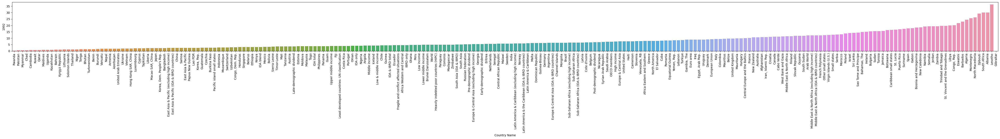

----------- Showing Result of : 1993 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Rwanda,Pakistan,Myanmar,Chad,Cambodia,Kuwait,Qatar,Maldives,Bahrain,Kazakhstan,Uganda,Tonga,Niger,Solomon Islands,Bhutan,Benin,Thailand,Turkmenistan,Burundi,Nepal,Vanuatu,United Arab Emirates,"Hong Kong SAR, China",Vietnam,Ukraine,"Macao SAR, China",Liberia,Luxembourg,Bangladesh,"Korea, Dem. People's Rep.",Papua New Guinea,Japan,Lao PDR,Burkina Faso,Guatemala,East Asia & Pacific (excluding high income),East Asia & Pacific (IDA & IBRD countries),Samoa,East Asia & Pacific,China,Mozambique,Cyprus,Pacific island small states,Indonesia,"Korea, Rep.","Congo, Dem. Rep.",Ethiopia,Singapore,Bolivia,Kenya,Honduras,IDA blend,Mexico,Kyrgyz Republic,Sierra Leone,Mali,Tanzania,Timor-Leste,Philippines,Moldova,Switzerland,Togo,Panama,IDA total,Late-demographic dividend,Least developed countries: UN classification,Costa Rica,Fiji,Oman,IDA only,Nigeria,Malaysia,Upper middle income,Angola,Austria,Czechia,Guinea,Chile,Azerbaijan,Peru,Middle income,Fragile and conflict affected situations,Low & middle income,Africa Western and Central,Ecuador,IDA & IBRD total,Brunei Darussalam,IBRD only,Low income,Uzbekistan,Lower middle income,Zimbabwe,Comoros,Heavily indebted poor countries (HIPC),Paraguay,Madagascar,South Asia,South Asia (IDA & IBRD),Pre-demographic dividend,World,Iceland,Ghana,Armenia,Portugal,Georgia,Guam,Senegal,Malawi,Early-demographic dividend,India,Central African Republic,Eritrea,Cote d'Ivoire,Russian Federation,Latin America & the Caribbean (IDA & IBRD coun...,Latin America & Caribbean (excluding high income),Norway,Brazil,Latin America & Caribbean,Europe & Central Asia (excluding high income),Malta,Tajikistan,Dominican Republic,Mongolia,Netherlands,Guinea-Bissau,Estonia,Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa,Sub-Saharan Africa (excluding high income),"Venezuela, RB",Saudi Arabia,United States,Nicaragua,Europe & Central Asia (IDA & IBRD countries),North America,Channel Islands,Syrian Arab Republic,Post-demographic dividend,Haiti,Germany,OECD members,Cameroon,Colombia,Africa Eastern and Southern,High income,Belgium,Cuba,Uruguay,"Yemen, Rep.",Romania,Equatorial Guinea,Lebanon,Belarus,Slovenia,Greece,Europe & Central Asia,Iraq,"Gambia, The",Turkiye,Sweden,Mauritius,Belize,New Zealand,Mauritania,El Salvador,Argentina,Italy,United Kingdom,"Iran, Islamic Rep.",Euro area,Croatia,Denmark,Afghanistan,European Union,Australia,"Egypt, Arab Rep.",Cabo Verde,West Bank and Gaza,France,Canada,Central Europe and the Baltics,Guyana,South Sudan,Middle East & North Africa,Hungary,Slovak Republic,French Polynesia,Virgin Islands (U.S.),"Bahamas, The",Israel,Serbia,Middle East & North Africa (excluding high inc...,Middle East & North Africa (IDA & IBRD countries),Arab World,Other small states,Morocco,Small states,Lithuania,Sri Lanka,Sao Tome and Principe,Poland,Sudan,Ireland,Suriname,Tunisia,Finland,Jamaica,Bulgaria,Caribbean small states,Latvia,St. Lucia,Puerto Rico,Gabon,New Caledonia,Botswana,Somalia,Bosnia and Herzegovina,Namibia,Zambia,Jordan,St. Vincent and the Grenadines,Trinidad and Tobago,Libya,"Congo, Rep.",Eswatini,Spain,Barbados,Albania,Montenegro,Algeria,North Macedonia,Djibouti,South Africa,

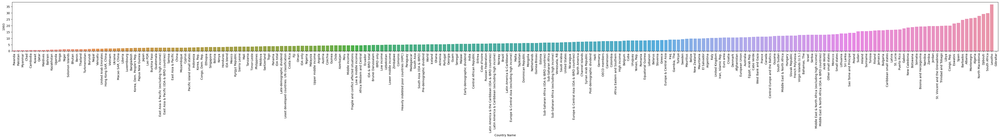

----------- Showing Result of : 1994 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Rwanda,Pakistan,Myanmar,Chad,Kuwait,Maldives,Qatar,Bahrain,Cambodia,Thailand,Benin,Solomon Islands,Niger,Uganda,Bhutan,Burundi,Vanuatu,Tonga,United Arab Emirates,Nepal,"Hong Kong SAR, China",Vietnam,Ukraine,Liberia,Bangladesh,Lao PDR,"Macao SAR, China","Korea, Rep.","Korea, Dem. People's Rep.",Burkina Faso,Guatemala,Papua New Guinea,Cyprus,Mozambique,Pacific island small states,China,Japan,East Asia & Pacific (excluding high income),"Congo, Dem. Rep.",East Asia & Pacific (IDA & IBRD countries),East Asia & Pacific,Singapore,Samoa,Kenya,Bolivia,Ethiopia,Honduras,Mali,Tanzania,Sierra Leone,Luxembourg,IDA blend,Timor-Leste,Austria,Philippines,Malaysia,Togo,Panama,Switzerland,Fiji,Least developed countries: UN classification,IDA total,Costa Rica,Nigeria,Oman,IDA only,Angola,Peru,Late-demographic dividend,Czechia,Indonesia,Paraguay,Mexico,Ecuador,Guinea,Africa Western and Central,Upper middle income,Fragile and conflict affected situations,Kyrgyz Republic,Turkmenistan,Middle income,Low & middle income,Low income,Zimbabwe,Cote d'Ivoire,Heavily indebted poor countries (HIPC),Comoros,IDA & IBRD total,Brunei Darussalam,South Asia,South Asia (IDA & IBRD),Pre-demographic dividend,Lower middle income,Madagascar,IBRD only,Iceland,Norway,World,Senegal,Central African Republic,India,Malawi,Moldova,Ghana,Chile,Eritrea,Early-demographic dividend,United States,Mongolia,Brazil,Malta,Azerbaijan,Latin America & Caribbean (excluding high income),Dominican Republic,Guinea-Bissau,Saudi Arabia,Latin America & the Caribbean (IDA & IBRD coun...,North America,Latin America & Caribbean,Sub-Saharan Africa (excluding high income),Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa,Armenia,Portugal,Nicaragua,Netherlands,Uzbekistan,Syrian Arab Republic,Post-demographic dividend,Kazakhstan,Estonia,Channel Islands,Guam,Haiti,El Salvador,Europe & Central Asia (excluding high income),Cameroon,OECD members,Africa Eastern and Southern,High income,Denmark,Russian Federation,Cuba,Romania,Slovenia,Colombia,"Yemen, Rep.",New Zealand,Georgia,Equatorial Guinea,Europe & Central Asia (IDA & IBRD countries),Lebanon,"Venezuela, RB",Turkiye,Germany,Tajikistan,Greece,"Gambia, The",Iraq,Uruguay,Sweden,Mauritius,Belgium,United Kingdom,Europe & Central Asia,Australia,Mauritania,Israel,"Iran, Islamic Rep.",Canada,Croatia,Afghanistan,Hungary,"Egypt, Arab Rep.",Italy,Belize,Cabo Verde,West Bank and Gaza,Central Europe and the Baltics,European Union,Argentina,Euro area,Guyana,Middle East & North Africa,South Sudan,French Polynesia,Virgin Islands (U.S.),France,Suriname,Belarus,Bulgaria,Middle East & North Africa (excluding high inc...,Middle East & North Africa (IDA & IBRD countries),Morocco,Arab World,Sri Lanka,Small states,Serbia,Other small states,Slovak Republic,Lithuania,"Bahamas, The",Sao Tome and Principe,Ireland,Puerto Rico,Poland,Jamaica,Sudan,Caribbean small states,Tunisia,Finland,St. Lucia,Jordan,Gabon,New Caledonia,Zambia,Trinidad and Tobago,Latvia,Somalia,Namibia,Libya,"Congo, Rep.",St. Vincent and the Grenadines,Bosnia and Herzegovina,Albania,Botswana,Eswatini,Barbados,Spain,Montenegro,Algeria,Djibouti,South Africa,North Macedonia,

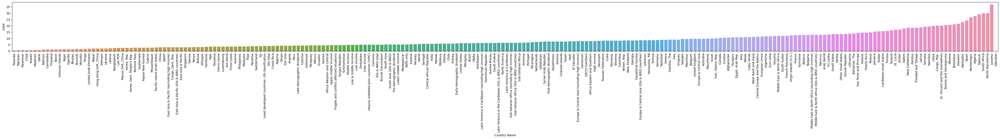

----------- Showing Result of : 1995 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Rwanda,Pakistan,Myanmar,Kuwait,Chad,Cambodia,Maldives,Qatar,Bahrain,Thailand,Benin,Solomon Islands,Niger,Bhutan,Burundi,Uganda,Nepal,Vanuatu,United Arab Emirates,Vietnam,Tonga,"Korea, Rep.",Liberia,Bangladesh,Burkina Faso,"Korea, Dem. People's Rep.",Lao PDR,Cyprus,Guatemala,Mozambique,Bolivia,Pacific island small states,Papua New Guinea,"Congo, Dem. Rep.",Luxembourg,East Asia & Pacific (excluding high income),China,East Asia & Pacific (IDA & IBRD countries),East Asia & Pacific,Kenya,Malaysia,Samoa,Japan,Ethiopia,"Hong Kong SAR, China",Honduras,Singapore,Switzerland,Tanzania,Mali,Paraguay,Sierra Leone,Timor-Leste,"Macao SAR, China",Philippines,IDA blend,Togo,Panama,Fiji,Least developed countries: UN classification,IDA total,Czechia,Nigeria,Oman,Cote d'Ivoire,Angola,IDA only,Austria,Late-demographic dividend,Guinea,Peru,Africa Western and Central,Ecuador,Indonesia,Chile,Low income,Comoros,Heavily indebted poor countries (HIPC),Upper middle income,Pre-demographic dividend,South Asia (IDA & IBRD),South Asia,Low & middle income,Middle income,Costa Rica,Brunei Darussalam,Fragile and conflict affected situations,Iceland,IDA & IBRD total,Madagascar,Moldova,Lower middle income,IBRD only,Senegal,Kyrgyz Republic,Ukraine,World,Zimbabwe,Malawi,United States,Central African Republic,India,Saudi Arabia,North America,Eritrea,Mongolia,Malta,Early-demographic dividend,Norway,Dominican Republic,Guinea-Bissau,Brazil,Ghana,New Zealand,Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa,Sub-Saharan Africa (excluding high income),Armenia,Denmark,Nicaragua,Portugal,Mexico,Slovenia,Netherlands,Syrian Arab Republic,Azerbaijan,Haiti,Channel Islands,Post-demographic dividend,High income,Georgia,Latin America & Caribbean (excluding high income),OECD members,Turkiye,Latin America & the Caribbean (IDA & IBRD coun...,El Salvador,Latin America & Caribbean,Uzbekistan,Africa Eastern and Southern,Guam,Cameroon,Romania,Germany,Cuba,Turkmenistan,Suriname,Equatorial Guinea,Australia,Lebanon,United Kingdom,Colombia,Israel,Sweden,Iraq,"Yemen, Rep.","Gambia, The",Greece,Europe & Central Asia (excluding high income),Belgium,Russian Federation,Europe & Central Asia (IDA & IBRD countries),Canada,"Iran, Islamic Rep.",Mauritius,Estonia,Mauritania,Europe & Central Asia,Uruguay,Hungary,Croatia,"Venezuela, RB",Tajikistan,"Bahamas, The",Central Europe and the Baltics,Kazakhstan,"Egypt, Arab Rep.",European Union,Bulgaria,West Bank and Gaza,Cabo Verde,Afghanistan,Euro area,Italy,France,Guyana,Ireland,South Sudan,French Polynesia,Virgin Islands (U.S.),Middle East & North Africa,Sri Lanka,Belize,Slovak Republic,Arab World,Middle East & North Africa (excluding high inc...,Middle East & North Africa (IDA & IBRD countries),Serbia,Morocco,Small states,Poland,Other small states,Puerto Rico,Sao Tome and Principe,Jordan,Albania,Caribbean small states,Sudan,St. Lucia,Tunisia,Jamaica,Zambia,Finland,Trinidad and Tobago,Lithuania,Gabon,Belarus,New Caledonia,Argentina,Latvia,Somalia,Barbados,St. Vincent and the Grenadines,"Congo, Rep.",Libya,Namibia,Botswana,Eswatini,Bosnia and Herzegovina,Spain,Montenegro,Djibouti,South Africa,Algeria,North Macedonia,

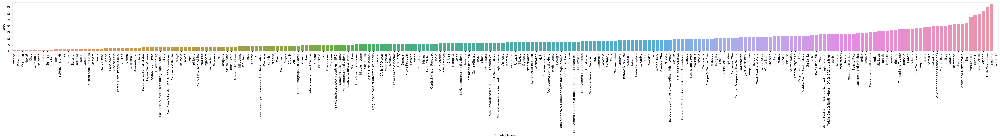

----------- Showing Result of : 1996 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Rwanda,Pakistan,Kuwait,Myanmar,Chad,Qatar,Cambodia,Maldives,Thailand,Bahrain,Benin,Bhutan,Niger,Solomon Islands,Burundi,Vanuatu,Nepal,United Arab Emirates,Uganda,Vietnam,Liberia,"Korea, Rep.",Bolivia,Burkina Faso,Tonga,Lao PDR,Bangladesh,Malaysia,"Korea, Dem. People's Rep.",Papua New Guinea,Guatemala,Mozambique,"Hong Kong SAR, China",Pacific island small states,"Congo, Dem. Rep.",Kenya,Cyprus,East Asia & Pacific (excluding high income),East Asia & Pacific (IDA & IBRD countries),China,East Asia & Pacific,Luxembourg,Tanzania,Ethiopia,Mali,Japan,Sierra Leone,Samoa,Timor-Leste,Singapore,Philippines,Iceland,Switzerland,Panama,Togo,IDA blend,Czechia,Fiji,Least developed countries: UN classification,Nigeria,Cote d'Ivoire,Angola,IDA total,Oman,IDA only,"Macao SAR, China",Honduras,Guinea,Africa Western and Central,Late-demographic dividend,Ecuador,Peru,Indonesia,Comoros,Low income,Heavily indebted poor countries (HIPC),Norway,Pre-demographic dividend,South Asia (IDA & IBRD),South Asia,Upper middle income,Low & middle income,Brunei Darussalam,Middle income,Austria,Lower middle income,IDA & IBRD total,Madagascar,United States,Mexico,Fragile and conflict affected situations,Saudi Arabia,Senegal,IBRD only,Malawi,World,Central African Republic,India,North America,Eritrea,Mongolia,Costa Rica,Early-demographic dividend,Malta,Zimbabwe,New Zealand,Dominican Republic,Guinea-Bissau,Netherlands,Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa (excluding high income),Sub-Saharan Africa,Turkiye,Romania,Denmark,Slovenia,Ghana,Nicaragua,Channel Islands,Brazil,Syrian Arab Republic,Haiti,Portugal,Kyrgyz Republic,Chile,High income,OECD members,Post-demographic dividend,Cuba,Ukraine,El Salvador,Latin America & Caribbean (excluding high income),Africa Eastern and Southern,Moldova,Latin America & the Caribbean (IDA & IBRD coun...,Cameroon,Latin America & Caribbean,Azerbaijan,Paraguay,United Kingdom,Guam,Israel,Lebanon,Australia,Equatorial Guinea,Germany,Iraq,"Gambia, The","Egypt, Arab Rep.","Iran, Islamic Rep.",Armenia,Belgium,Mauritius,Sweden,"Yemen, Rep.",Canada,Greece,Russian Federation,Croatia,Mauritania,Estonia,Hungary,Europe & Central Asia (excluding high income),Europe & Central Asia (IDA & IBRD countries),Central Europe and the Baltics,Turkmenistan,Europe & Central Asia,Uzbekistan,Suriname,Afghanistan,West Bank and Gaza,European Union,Cabo Verde,Middle East & North Africa,Slovak Republic,Sri Lanka,"Bahamas, The",Georgia,Euro area,Ireland,"Venezuela, RB",Colombia,Guyana,Italy,Uruguay,South Sudan,French Polynesia,Virgin Islands (U.S.),Middle East & North Africa (excluding high inc...,Middle East & North Africa (IDA & IBRD countries),France,Arab World,Bulgaria,Poland,Kazakhstan,Morocco,Serbia,Tajikistan,Puerto Rico,Small states,Jordan,Belize,Albania,Other small states,Sao Tome and Principe,Barbados,Caribbean small states,Zambia,Sudan,Finland,Tunisia,Jamaica,Trinidad and Tobago,St. Lucia,Lithuania,Argentina,Gabon,New Caledonia,Somalia,Libya,"Congo, Rep.",St. Vincent and the Grenadines,Latvia,Botswana,Eswatini,Spain,Bosnia and Herzegovina,Namibia,Belarus,Montenegro,Algeria,Djibouti,South Africa,Lesotho,North Ma

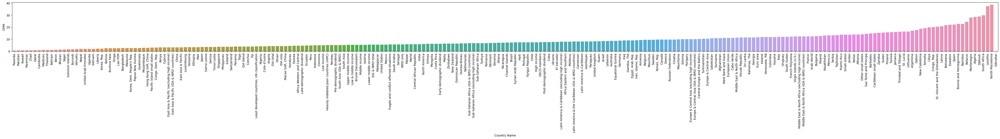

----------- Showing Result of : 1997 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Pakistan,Rwanda,Kuwait,Myanmar,Chad,Qatar,Thailand,Cambodia,Bahrain,Benin,Maldives,Bhutan,Niger,Burundi,Solomon Islands,Vanuatu,Nepal,United Arab Emirates,Liberia,Bolivia,Uganda,"Hong Kong SAR, China",Lao PDR,Malaysia,Burkina Faso,Singapore,Luxembourg,"Korea, Rep.",Guatemala,"Korea, Dem. People's Rep.",Bangladesh,Mozambique,Vietnam,Papua New Guinea,Tonga,"Congo, Dem. Rep.",Pacific island small states,Kenya,East Asia & Pacific (excluding high income),East Asia & Pacific (IDA & IBRD countries),China,East Asia & Pacific,Tanzania,"Macao SAR, China",Mali,Honduras,Japan,Cyprus,Sierra Leone,Ethiopia,Timor-Leste,Philippines,Iceland,Panama,Togo,IDA blend,Samoa,Least developed countries: UN classification,Nigeria,Fiji,Angola,Oman,Cote d'Ivoire,IDA total,Switzerland,Mexico,IDA only,Czechia,Guinea,Ecuador,Peru,Africa Western and Central,Indonesia,Norway,Comoros,Late-demographic dividend,Low income,South Asia,South Asia (IDA & IBRD),Heavily indebted poor countries (HIPC),United States,Pre-demographic dividend,Austria,Saudi Arabia,Brunei Darussalam,Low & middle income,Upper middle income,Middle income,Lower middle income,Paraguay,Denmark,North America,IDA & IBRD total,Madagascar,Romania,Netherlands,Senegal,India,Fragile and conflict affected situations,Costa Rica,IBRD only,World,Malawi,Central African Republic,Early-demographic dividend,Eritrea,Mongolia,Malta,Dominican Republic,Guinea-Bissau,Portugal,Sub-Saharan Africa (excluding high income),Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa,Slovenia,Turkiye,New Zealand,Zimbabwe,Channel Islands,United Kingdom,Cuba,High income,Chile,Nicaragua,OECD members,Haiti,Post-demographic dividend,Syrian Arab Republic,Kyrgyz Republic,Ghana,Latin America & Caribbean (excluding high income),Latin America & the Caribbean (IDA & IBRD coun...,Africa Eastern and Southern,Latin America & Caribbean,Moldova,Cameroon,El Salvador,Brazil,Australia,"Egypt, Arab Rep.",Equatorial Guinea,Lebanon,Iraq,Ukraine,Belgium,Hungary,"Gambia, The",Azerbaijan,Canada,Central Europe and the Baltics,Mauritius,Greece,Guam,Croatia,Israel,"Bahamas, The","Iran, Islamic Rep.",Germany,Mauritania,Ireland,"Yemen, Rep.",Sweden,Estonia,Europe & Central Asia,Suriname,Sri Lanka,Europe & Central Asia (IDA & IBRD countries),Afghanistan,Armenia,West Bank and Gaza,European Union,Uzbekistan,Poland,Turkmenistan,Middle East & North Africa,Cabo Verde,Europe & Central Asia (excluding high income),"Venezuela, RB",Uruguay,Georgia,Euro area,Russian Federation,Guyana,Slovak Republic,French Polynesia,Arab World,South Sudan,Italy,Middle East & North Africa (excluding high inc...,Middle East & North Africa (IDA & IBRD countries),Virgin Islands (U.S.),Colombia,France,Belize,Kazakhstan,Zambia,Jordan,Bulgaria,Morocco,Small states,Puerto Rico,Serbia,Tajikistan,Lithuania,Other small states,Sao Tome and Principe,Barbados,Argentina,Caribbean small states,Latvia,Finland,Trinidad and Tobago,Sudan,Tunisia,Jamaica,Albania,Belarus,Gabon,New Caledonia,Somalia,Libya,"Congo, Rep.",St. Vincent and the Grenadines,St. Lucia,Spain,Botswana,Eswatini,Bosnia and Herzegovina,Namibia,Algeria,Montenegro,Djibouti,South Africa,North Macedonia,

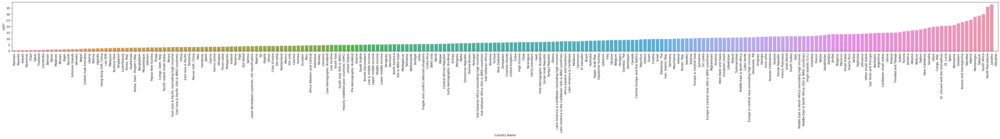

----------- Showing Result of : 1998 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Pakistan,Rwanda,Kuwait,Myanmar,Chad,Qatar,Cambodia,Benin,Bahrain,Bhutan,Niger,Maldives,Burundi,Solomon Islands,Vanuatu,Nepal,Liberia,Bolivia,United Arab Emirates,Vietnam,Lao PDR,Burkina Faso,Uganda,Guatemala,Mozambique,Luxembourg,"Korea, Dem. People's Rep.","Congo, Dem. Rep.",Bangladesh,Papua New Guinea,Pacific island small states,Kenya,Iceland,Tanzania,Malaysia,Tonga,China,Cyprus,East Asia & Pacific (excluding high income),East Asia & Pacific (IDA & IBRD countries),Thailand,Singapore,Sierra Leone,East Asia & Pacific,Switzerland,Timor-Leste,Ethiopia,Mexico,Norway,Panama,Philippines,Togo,Fiji,Nigeria,Honduras,Least developed countries: UN classification,Mali,IDA blend,Angola,Japan,Cote d'Ivoire,Oman,Samoa,IDA total,IDA only,Netherlands,Paraguay,United States,Guinea,"Hong Kong SAR, China",Ecuador,"Macao SAR, China",Portugal,Africa Western and Central,Saudi Arabia,Comoros,North America,Peru,Pre-demographic dividend,Low income,South Asia (IDA & IBRD),South Asia,Heavily indebted poor countries (HIPC),Denmark,Late-demographic dividend,Costa Rica,Brunei Darussalam,Indonesia,Austria,Low & middle income,Lower middle income,Madagascar,Middle income,Senegal,Upper middle income,IDA & IBRD total,Romania,India,Central African Republic,Malawi,World,Czechia,IBRD only,Fragile and conflict affected situations,Eritrea,Early-demographic dividend,Mongolia,United Kingdom,Cuba,Malta,Guinea-Bissau,Dominican Republic,Zimbabwe,Channel Islands,Sub-Saharan Africa (excluding high income),Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa,Turkiye,"Korea, Rep.",High income,El Salvador,OECD members,Nicaragua,Haiti,Chile,Post-demographic dividend,Slovenia,Syrian Arab Republic,"Bahamas, The",Australia,Ireland,New Zealand,Guam,Africa Eastern and Southern,Cameroon,"Egypt, Arab Rep.",Latin America & Caribbean (excluding high income),Ghana,Latin America & Caribbean,Latin America & the Caribbean (IDA & IBRD coun...,Canada,Lebanon,Equatorial Guinea,Iraq,Kyrgyz Republic,Hungary,Sweden,Central Europe and the Baltics,"Gambia, The",Sri Lanka,Belgium,Mauritius,Uruguay,Armenia,Brazil,Estonia,Germany,Mauritania,Poland,Azerbaijan,Moldova,"Iran, Islamic Rep.",European Union,Suriname,West Bank and Gaza,Europe & Central Asia,Israel,Afghanistan,"Yemen, Rep.",Greece,Cabo Verde,"Venezuela, RB",Euro area,Middle East & North Africa,Ukraine,Croatia,Europe & Central Asia (IDA & IBRD countries),French Polynesia,Virgin Islands (U.S.),Guyana,Arab World,Zambia,South Sudan,France,Italy,Slovak Republic,Bulgaria,Turkmenistan,Europe & Central Asia (excluding high income),Middle East & North Africa (excluding high inc...,Middle East & North Africa (IDA & IBRD countries),Barbados,Argentina,Kazakhstan,Finland,Russian Federation,Uzbekistan,Small states,Puerto Rico,Morocco,Serbia,Jordan,Lithuania,Belarus,Other small states,Caribbean small states,Trinidad and Tobago,Belize,Sao Tome and Principe,Latvia,Georgia,Colombia,Sudan,Jamaica,Tunisia,Tajikistan,Gabon,New Caledonia,Spain,Somalia,Libya,"Congo, Rep.",Albania,St. Vincent and the Grenadines,Botswana,St. Lucia,Namibia,Eswatini,Bosnia and Herzegovina,Algeria,Montenegro,Djibouti,South Africa,North Macedonia,

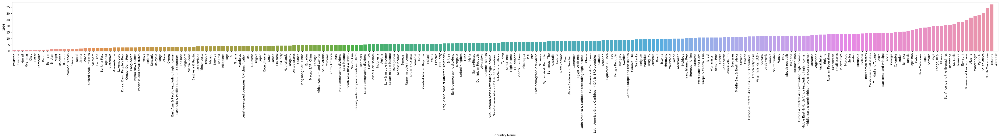

----------- Showing Result of : 1999 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Pakistan,Myanmar,Kuwait,Rwanda,Chad,Qatar,Cambodia,Benin,Bahrain,Bhutan,Niger,Burundi,Solomon Islands,Maldives,Vanuatu,Nepal,Liberia,Lao PDR,Iceland,United Arab Emirates,Vietnam,Luxembourg,Bolivia,Burkina Faso,Mexico,Guatemala,Uganda,Mozambique,Papua New Guinea,"Congo, Dem. Rep.",Pacific island small states,"Korea, Dem. People's Rep.",Thailand,Kenya,Bangladesh,Tanzania,Switzerland,Norway,China,Malaysia,East Asia & Pacific (excluding high income),Sierra Leone,East Asia & Pacific (IDA & IBRD countries),Tonga,Netherlands,East Asia & Pacific,Philippines,Ethiopia,Fiji,Panama,Honduras,Timor-Leste,Togo,Nigeria,IDA blend,Angola,Least developed countries: UN classification,Oman,United States,IDA total,Cote d'Ivoire,Saudi Arabia,Samoa,IDA only,Guinea,North America,Portugal,Austria,Japan,Comoros,Mali,Singapore,Africa Western and Central,Peru,Pre-demographic dividend,South Asia,South Asia (IDA & IBRD),Low income,Denmark,Heavily indebted poor countries (HIPC),Ecuador,Paraguay,Late-demographic dividend,Brunei Darussalam,Senegal,Central African Republic,Madagascar,Low & middle income,Cyprus,Lower middle income,India,Middle income,Upper middle income,Malawi,Ireland,IDA & IBRD total,Costa Rica,Eritrea,World,Zimbabwe,United Kingdom,IBRD only,Mongolia,Fragile and conflict affected situations,Channel Islands,Romania,"Hong Kong SAR, China",Cuba,Malta,Early-demographic dividend,Guinea-Bissau,"Korea, Rep.","Macao SAR, China",Indonesia,Dominican Republic,El Salvador,Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa (excluding high income),Sub-Saharan Africa,Australia,High income,Hungary,New Zealand,Post-demographic dividend,OECD members,Haiti,Nicaragua,Slovenia,"Bahamas, The",Canada,Syrian Arab Republic,Sweden,Turkiye,Cameroon,Africa Eastern and Southern,"Egypt, Arab Rep.",Kyrgyz Republic,Lebanon,Equatorial Guinea,Czechia,Belgium,Iraq,Latin America & Caribbean (excluding high income),Germany,Sri Lanka,"Gambia, The",Latin America & Caribbean,Latin America & the Caribbean (IDA & IBRD coun...,Mauritius,Mauritania,Ghana,European Union,Brazil,Central Europe and the Baltics,Euro area,Uruguay,Barbados,West Bank and Gaza,Europe & Central Asia,Afghanistan,Azerbaijan,"Iran, Islamic Rep.",Cabo Verde,Moldova,Chile,Israel,Armenia,"Yemen, Rep.",Virgin Islands (U.S.),Middle East & North Africa,Estonia,Finland,Italy,French Polynesia,Puerto Rico,Guyana,Greece,Ukraine,France,Europe & Central Asia (IDA & IBRD countries),South Sudan,Arab World,Poland,Europe & Central Asia (excluding high income),Zambia,Middle East & North Africa (excluding high inc...,Middle East & North Africa (IDA & IBRD countries),Turkmenistan,Belarus,Belize,Russian Federation,Trinidad and Tobago,Uzbekistan,Small states,Lithuania,Kazakhstan,Croatia,Suriname,Serbia,Jordan,Latvia,Georgia,Caribbean small states,Morocco,Guam,Other small states,Argentina,Bulgaria,Sao Tome and Principe,"Venezuela, RB",Tunisia,Sudan,Tajikistan,Spain,Jamaica,Slovak Republic,Gabon,New Caledonia,St. Lucia,Botswana,Somalia,Libya,"Congo, Rep.",Colombia,St. Vincent and the Grenadines,Albania,Namibia,Eswatini,Bosnia and Herzegovina,Montenegro,Algeria,Djibouti,South Africa,North Macedonia,

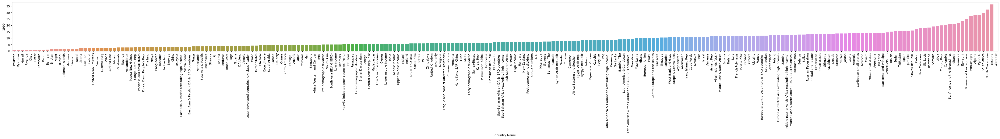

----------- Showing Result of : 2000 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Pakistan,Myanmar,Rwanda,Kuwait,Chad,Qatar,Benin,Cambodia,Bahrain,Niger,Burundi,Bhutan,Vanuatu,Nepal,Iceland,Maldives,Solomon Islands,Lao PDR,Liberia,United Arab Emirates,Vietnam,Luxembourg,Bolivia,Thailand,Burkina Faso,Mexico,Switzerland,Guatemala,Netherlands,Mozambique,"Congo, Dem. Rep.",Papua New Guinea,"Korea, Dem. People's Rep.",Malaysia,Kenya,Uganda,Tanzania,Pacific island small states,China,Bangladesh,East Asia & Pacific (excluding high income),East Asia & Pacific (IDA & IBRD countries),Timor-Leste,Sierra Leone,Norway,Ethiopia,East Asia & Pacific,Philippines,Singapore,Portugal,Panama,Honduras,IDA blend,Nigeria,Togo,United States,Fiji,Angola,"Korea, Rep.",Tonga,Oman,Least developed countries: UN classification,North America,Ireland,IDA total,Denmark,Guinea,Saudi Arabia,Cote d'Ivoire,IDA only,Samoa,Comoros,Austria,Japan,Ecuador,Peru,"Hong Kong SAR, China",Africa Western and Central,South Asia,South Asia (IDA & IBRD),Cyprus,Pre-demographic dividend,Costa Rica,Late-demographic dividend,Low income,Heavily indebted poor countries (HIPC),Cuba,Sweden,Upper middle income,Low & middle income,United Kingdom,India,Middle income,Senegal,Central African Republic,Mali,Lower middle income,Channel Islands,Brunei Darussalam,Zimbabwe,IDA & IBRD total,World,Malawi,Madagascar,Eritrea,IBRD only,Indonesia,New Zealand,Fragile and conflict affected situations,Mongolia,Early-demographic dividend,Guinea-Bissau,Australia,Malta,Dominican Republic,Turkiye,Post-demographic dividend,High income,Hungary,Belgium,Sub-Saharan Africa (excluding high income),Sub-Saharan Africa,Sub-Saharan Africa (IDA & IBRD countries),OECD members,Canada,"Macao SAR, China",Slovenia,El Salvador,Romania,"Bahamas, The",Nicaragua,Kyrgyz Republic,Cameroon,Paraguay,Africa Eastern and Southern,Sri Lanka,Germany,Lebanon,Haiti,Equatorial Guinea,Moldova,Latin America & Caribbean (excluding high income),Iraq,Czechia,"Egypt, Arab Rep.",Latin America & Caribbean,Latin America & the Caribbean (IDA & IBRD coun...,"Gambia, The",Mauritius,Barbados,Euro area,Brazil,Syrian Arab Republic,Europe & Central Asia,European Union,Mauritania,Puerto Rico,France,Ghana,Chile,Russian Federation,West Bank and Gaza,Afghanistan,Georgia,Italy,Belize,Europe & Central Asia (excluding high income),Cabo Verde,Armenia,Israel,Virgin Islands (U.S.),Finland,Europe & Central Asia (IDA & IBRD countries),Greece,Turkmenistan,"Yemen, Rep.","Iran, Islamic Rep.",French Polynesia,Ukraine,Azerbaijan,Guyana,Middle East & North Africa,South Sudan,Trinidad and Tobago,Uzbekistan,Belarus,Central Europe and the Baltics,Arab World,Serbia,Uruguay,Suriname,Kazakhstan,Zambia,Small states,Middle East & North Africa (excluding high inc...,Middle East & North Africa (IDA & IBRD countries),Estonia,Caribbean small states,Morocco,Other small states,Jordan,Spain,"Venezuela, RB",Latvia,Sao Tome and Principe,Tunisia,Argentina,Tajikistan,Sudan,Guam,Jamaica,Botswana,Lithuania,Croatia,Bulgaria,Poland,St. Lucia,Gabon,New Caledonia,Albania,Somalia,Slovak Republic,Libya,"Congo, Rep.",Namibia,Colombia,St. Vincent and the Grenadines,Eswatini,Bosnia and Herzegovina,Djibouti,Montenegro,Algeria,South Africa,North Macedonia,

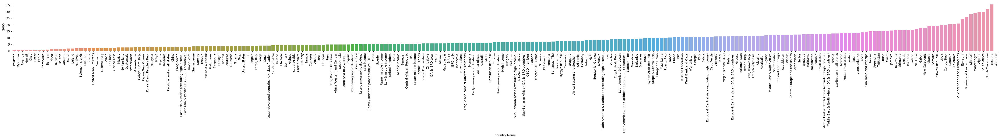

----------- Showing Result of : 2001 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Pakistan,Myanmar,Benin,Kuwait,Chad,Rwanda,Qatar,Cambodia,Bahrain,Niger,Burundi,Nepal,Luxembourg,Iceland,Vanuatu,Bhutan,Solomon Islands,Lao PDR,Netherlands,Liberia,Bolivia,Switzerland,United Arab Emirates,Thailand,Mexico,Burkina Faso,Vietnam,Guatemala,Papua New Guinea,Mozambique,"Congo, Dem. Rep.","Korea, Dem. People's Rep.",Kenya,Tanzania,Maldives,Pacific island small states,Uganda,Ethiopia,Timor-Leste,Sierra Leone,Malaysia,Bangladesh,Ireland,Philippines,"Korea, Rep.",IDA blend,Norway,Singapore,China,Panama,Portugal,East Asia & Pacific (excluding high income),East Asia & Pacific (IDA & IBRD countries),Fiji,Nigeria,East Asia & Pacific,Cyprus,Honduras,Angola,Austria,Togo,Cuba,Oman,Denmark,Least developed countries: UN classification,Ecuador,Tonga,IDA total,Guinea,Saudi Arabia,IDA only,Comoros,United Kingdom,Sweden,United States,Cote d'Ivoire,Africa Western and Central,Samoa,South Asia (IDA & IBRD),South Asia,North America,Japan,Peru,Pre-demographic dividend,"Hong Kong SAR, China",Heavily indebted poor countries (HIPC),Low income,Channel Islands,Madagascar,Zimbabwe,Late-demographic dividend,New Zealand,India,Senegal,Lower middle income,Low & middle income,Hungary,Slovenia,Central African Republic,Middle income,Eritrea,Upper middle income,Brunei Darussalam,Malawi,IDA & IBRD total,World,Costa Rica,Indonesia,Fragile and conflict affected situations,IBRD only,Belgium,Paraguay,Mongolia,Guinea-Bissau,Mali,Early-demographic dividend,Post-demographic dividend,"Macao SAR, China",High income,Romania,OECD members,Sub-Saharan Africa (excluding high income),Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa,Australia,"Bahamas, The",El Salvador,Malta,Canada,Dominican Republic,Moldova,Nicaragua,Cameroon,Africa Eastern and Southern,Germany,Kyrgyz Republic,Sri Lanka,Czechia,Lebanon,Euro area,Turkiye,Latin America & Caribbean (excluding high income),Equatorial Guinea,France,Latin America & Caribbean,Latin America & the Caribbean (IDA & IBRD coun...,Iraq,Russian Federation,Belize,Europe & Central Asia,"Gambia, The",Mauritius,European Union,"Egypt, Arab Rep.",Ghana,Italy,Brazil,Haiti,Mauritania,Barbados,Europe & Central Asia (excluding high income),Finland,Spain,Chile,Kazakhstan,Greece,Turkmenistan,Afghanistan,Europe & Central Asia (IDA & IBRD countries),Trinidad and Tobago,Azerbaijan,Armenia,Cabo Verde,Ukraine,Virgin Islands (U.S.),Georgia,Uzbekistan,Puerto Rico,Belarus,Syrian Arab Republic,"Yemen, Rep.",French Polynesia,Israel,Guyana,Suriname,South Sudan,Middle East & North Africa,"Iran, Islamic Rep.",Morocco,Arab World,Caribbean small states,Serbia,Small states,"Venezuela, RB",Estonia,Middle East & North Africa (IDA & IBRD countries),Guam,Central Europe and the Baltics,Middle East & North Africa (excluding high inc...,Zambia,Other small states,Latvia,Tunisia,Jordan,Tajikistan,Jamaica,Colombia,Uruguay,Sudan,Sao Tome and Principe,Croatia,Lithuania,Gabon,New Caledonia,Argentina,Poland,St. Lucia,Botswana,Albania,Somalia,Slovak Republic,Libya,"Congo, Rep.",Bulgaria,Namibia,St. Vincent and the Grenadines,West Bank and Gaza,Eswatini,Bosnia and Herzegovina,Algeria,Djibouti,Montenegro,North Macedonia,South Africa,

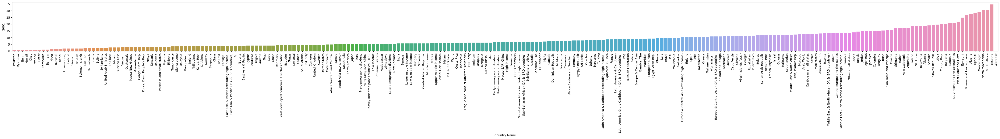

----------- Showing Result of : 2002 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Pakistan,Myanmar,Benin,Chad,Qatar,Rwanda,Cambodia,Kuwait,Bahrain,Nepal,Burundi,Lao PDR,Thailand,Solomon Islands,Bhutan,Niger,Vanuatu,Vietnam,Liberia,Bolivia,Netherlands,Luxembourg,United Arab Emirates,Burkina Faso,Papua New Guinea,Guatemala,"Congo, Dem. Rep.",Mozambique,"Korea, Dem. People's Rep.",Switzerland,Iceland,Kenya,Mexico,Tanzania,"Korea, Rep.",Pacific island small states,Ethiopia,Cyprus,Cuba,Sierra Leone,Malaysia,Uganda,IDA blend,Timor-Leste,Philippines,Panama,Fiji,Nigeria,Bangladesh,Angola,Honduras,Norway,Togo,East Asia & Pacific (excluding high income),East Asia & Pacific (IDA & IBRD countries),Maldives,Oman,Ireland,China,East Asia & Pacific,Denmark,Least developed countries: UN classification,IDA total,Portugal,Guinea,Comoros,Tonga,IDA only,Africa Western and Central,Peru,Austria,Ecuador,Sweden,South Asia (IDA & IBRD),South Asia,Cote d'Ivoire,United Kingdom,Zimbabwe,Samoa,Pre-demographic dividend,Heavily indebted poor countries (HIPC),Saudi Arabia,New Zealand,Low income,Madagascar,Japan,India,Late-demographic dividend,Channel Islands,Lower middle income,Hungary,Senegal,Singapore,Eritrea,El Salvador,United States,Central African Republic,Low & middle income,Malawi,Middle income,Slovenia,Brunei Darussalam,North America,IDA & IBRD total,Upper middle income,World,Fragile and conflict affected situations,Mongolia,"Macao SAR, China",Costa Rica,Australia,Guinea-Bissau,IBRD only,Early-demographic dividend,Indonesia,Cameroon,Post-demographic dividend,Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa,Sub-Saharan Africa (excluding high income),Dominican Republic,Moldova,Malta,Belgium,High income,Czechia,OECD members,Mali,"Hong Kong SAR, China",Nicaragua,Canada,Russian Federation,Africa Eastern and Southern,Lebanon,Romania,Mauritius,Germany,Latin America & Caribbean (excluding high income),Ghana,Euro area,France,Equatorial Guinea,Sri Lanka,Iraq,Latin America & Caribbean,Latin America & the Caribbean (IDA & IBRD coun...,"Bahamas, The",Europe & Central Asia,Italy,"Gambia, The",Kazakhstan,Brazil,Paraguay,European Union,Turkmenistan,Europe & Central Asia (excluding high income),Mauritania,Greece,"Egypt, Arab Rep.",Estonia,Belize,Azerbaijan,Ukraine,Uzbekistan,Chile,Barbados,Turkiye,Trinidad and Tobago,Finland,Europe & Central Asia (IDA & IBRD countries),Armenia,Haiti,Belarus,Syrian Arab Republic,Cabo Verde,Spain,Suriname,Virgin Islands (U.S.),Afghanistan,Guam,Morocco,French Polynesia,Guyana,"Yemen, Rep.",Puerto Rico,South Sudan,Middle East & North Africa,Arab World,Caribbean small states,Kyrgyz Republic,Georgia,Small states,"Iran, Islamic Rep.",Israel,Lithuania,Middle East & North Africa (IDA & IBRD countries),Middle East & North Africa (excluding high inc...,Other small states,Central Europe and the Baltics,Serbia,Latvia,Zambia,Jamaica,Tajikistan,Colombia,Tunisia,Croatia,Sudan,Jordan,"Venezuela, RB",Uruguay,New Caledonia,Gabon,Sao Tome and Principe,Albania,Bulgaria,Slovak Republic,Somalia,Argentina,Libya,"Congo, Rep.",Poland,St. Lucia,St. Vincent and the Grenadines,Botswana,Namibia,Eswatini,Algeria,West Bank and Gaza,Bosnia and Herzegovina,Djibouti,Montenegro,North Macedonia,South Africa,

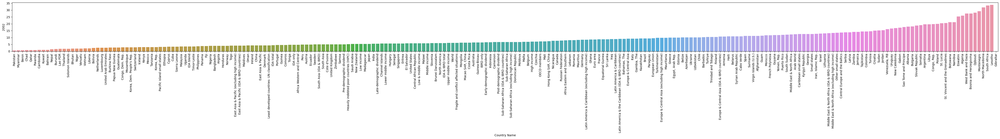

----------- Showing Result of : 2003 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Pakistan,Myanmar,Benin,Chad,Qatar,Rwanda,Bahrain,Cambodia,Kuwait,Thailand,Nepal,Burundi,Lao PDR,Solomon Islands,Vanuatu,Bhutan,Liberia,Vietnam,Niger,Cuba,Bolivia,Papua New Guinea,United Arab Emirates,Burkina Faso,Guatemala,"Congo, Dem. Rep.","Korea, Dem. People's Rep.",Mozambique,Ethiopia,Kenya,Pacific island small states,Tanzania,"Korea, Rep.",IDA blend,Sierra Leone,Mexico,Timor-Leste,Philippines,Netherlands,Uganda,Malaysia,Luxembourg,Panama,Nigeria,Fiji,Angola,Iceland,Togo,Switzerland,Cyprus,Peru,Norway,Oman,Bangladesh,IDA total,East Asia & Pacific (excluding high income),East Asia & Pacific (IDA & IBRD countries),Least developed countries: UN classification,East Asia & Pacific,Ireland,China,Comoros,Guinea,New Zealand,Zimbabwe,Africa Western and Central,Austria,IDA only,United Kingdom,Madagascar,South Asia,South Asia (IDA & IBRD),Pre-demographic dividend,Samoa,Heavily indebted poor countries (HIPC),Tonga,Japan,Cote d'Ivoire,Low income,Honduras,Maldives,Denmark,Sweden,Saudi Arabia,Eritrea,Lower middle income,India,Ecuador,Late-demographic dividend,Hungary,Malawi,Central African Republic,Low & middle income,Channel Islands,Singapore,Australia,Cameroon,Middle income,Fragile and conflict affected situations,United States,"Macao SAR, China",Brunei Darussalam,IDA & IBRD total,Portugal,North America,World,Upper middle income,El Salvador,Guinea-Bissau,IBRD only,Slovenia,Early-demographic dividend,Costa Rica,Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa (excluding high income),Sub-Saharan Africa,Indonesia,Senegal,Mongolia,Paraguay,Post-demographic dividend,Dominican Republic,Romania,High income,OECD members,Malta,Czechia,Ghana,Canada,Nicaragua,Belgium,Africa Eastern and Southern,"Hong Kong SAR, China",Mali,Moldova,Lebanon,Russian Federation,Sri Lanka,Mauritius,France,Latin America & Caribbean (excluding high income),Equatorial Guinea,Kazakhstan,Latin America & Caribbean,Iraq,Italy,Latin America & the Caribbean (IDA & IBRD coun...,Euro area,Turkmenistan,Ukraine,Uzbekistan,Europe & Central Asia,"Gambia, The",Azerbaijan,Greece,Europe & Central Asia (excluding high income),European Union,Guam,Chile,Germany,Mauritania,Kyrgyz Republic,Brazil,Belize,Syrian Arab Republic,Suriname,Belarus,Europe & Central Asia (IDA & IBRD countries),Finland,Trinidad and Tobago,Turkiye,Armenia,"Bahamas, The",Cabo Verde,Barbados,"Egypt, Arab Rep.",Afghanistan,Spain,Estonia,Virgin Islands (U.S.),Georgia,"Iran, Islamic Rep.",Guyana,French Polynesia,Caribbean small states,Jamaica,Puerto Rico,Morocco,Middle East & North Africa,"Yemen, Rep.",Haiti,Latvia,South Sudan,Arab World,Small states,Middle East & North Africa (IDA & IBRD countries),Lithuania,Central Europe and the Baltics,Middle East & North Africa (excluding high inc...,Colombia,Israel,Other small states,Bulgaria,Croatia,Tajikistan,Jordan,Tunisia,Zambia,Sudan,Serbia,Argentina,Sao Tome and Principe,New Caledonia,Uruguay,"Venezuela, RB",Albania,Gabon,Slovak Republic,Somalia,Poland,Libya,"Congo, Rep.",St. Vincent and the Grenadines,Namibia,St. Lucia,West Bank and Gaza,Algeria,Botswana,Eswatini,Djibouti,Bosnia and Herzegovina,Montenegro,South Africa,Lesotho,North Ma

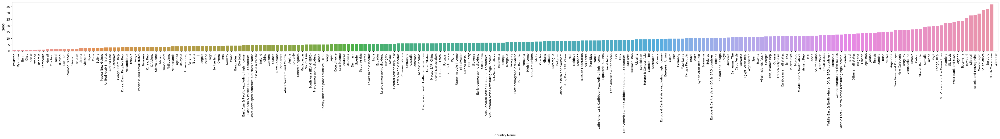

----------- Showing Result of : 2004 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Pakistan,Myanmar,Benin,Chad,Qatar,Rwanda,Bahrain,Cambodia,Thailand,Lao PDR,Nepal,Burundi,Kuwait,Solomon Islands,Vanuatu,Cuba,Vietnam,Liberia,Bhutan,Bolivia,Papua New Guinea,Ethiopia,Niger,Uganda,"Congo, Dem. Rep.","Korea, Dem. People's Rep.",United Arab Emirates,Kenya,Guatemala,Mozambique,Pacific island small states,Tanzania,IDA blend,Burkina Faso,"Korea, Rep.",Sierra Leone,Timor-Leste,Malaysia,Philippines,Panama,Fiji,Madagascar,Nigeria,Angola,Mexico,Tonga,New Zealand,Iceland,Togo,Oman,Norway,Bangladesh,IDA total,Switzerland,Cyprus,East Asia & Pacific (excluding high income),Zimbabwe,East Asia & Pacific,East Asia & Pacific (IDA & IBRD countries),Least developed countries: UN classification,Ireland,China,Comoros,United Kingdom,Guinea,Netherlands,Peru,IDA only,Japan,Africa Western and Central,"Macao SAR, China",Ecuador,Heavily indebted poor countries (HIPC),South Asia (IDA & IBRD),South Asia,Pre-demographic dividend,Luxembourg,Cameroon,Low income,Denmark,Samoa,Eritrea,Australia,Cote d'Ivoire,Lower middle income,United States,Late-demographic dividend,India,North America,Central African Republic,Low & middle income,Middle income,Malawi,Saudi Arabia,Hungary,Austria,Singapore,Fragile and conflict affected situations,IDA & IBRD total,Honduras,World,Upper middle income,Slovenia,Brunei Darussalam,El Salvador,Channel Islands,Guinea-Bissau,Dominican Republic,IBRD only,Portugal,Sub-Saharan Africa,Sub-Saharan Africa (excluding high income),Sub-Saharan Africa (IDA & IBRD countries),Early-demographic dividend,Costa Rica,Nicaragua,Maldives,Paraguay,Ghana,Post-demographic dividend,Sweden,"Hong Kong SAR, China",Mongolia,High income,OECD members,Canada,Indonesia,Africa Eastern and Southern,Malta,Belgium,Guam,Romania,Russian Federation,Senegal,Lebanon,Italy,Latin America & Caribbean (excluding high income),Azerbaijan,Moldova,Turkmenistan,Uzbekistan,Czechia,Latin America & Caribbean,Trinidad and Tobago,Mauritius,Sri Lanka,Kazakhstan,Latin America & the Caribbean (IDA & IBRD coun...,Kyrgyz Republic,Ukraine,Iraq,Equatorial Guinea,Mali,France,Brazil,Europe & Central Asia,"Gambia, The",Euro area,Europe & Central Asia (excluding high income),Suriname,Syrian Arab Republic,Barbados,Mauritania,Belarus,European Union,Europe & Central Asia (IDA & IBRD countries),Chile,"Bahamas, The",Estonia,"Iran, Islamic Rep.",Puerto Rico,Greece,"Egypt, Arab Rep.",Armenia,Finland,Belize,Lithuania,Germany,Middle East & North Africa,Morocco,Turkiye,Cabo Verde,Afghanistan,Virgin Islands (U.S.),Spain,Caribbean small states,Guyana,Arab World,Middle East & North Africa (IDA & IBRD countries),Middle East & North Africa (excluding high inc...,French Polynesia,Latvia,Bulgaria,"Yemen, Rep.",South Sudan,Small states,Jamaica,Georgia,Colombia,Central Europe and the Baltics,Uruguay,Israel,Other small states,Haiti,Argentina,Tajikistan,Croatia,Tunisia,Jordan,Sudan,"Venezuela, RB",Zambia,Sao Tome and Principe,Albania,New Caledonia,Gabon,Algeria,Serbia,Slovak Republic,Somalia,Poland,Libya,"Congo, Rep.",St. Vincent and the Grenadines,St. Lucia,Botswana,Namibia,West Bank and Gaza,Eswatini,Djibouti,Bosnia and Herzegovina,South Africa,Montenegro,Lesotho,North Ma

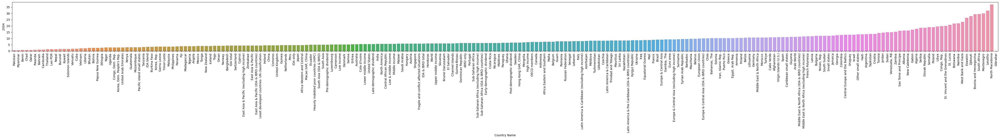

----------- Showing Result of : 2005 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Pakistan,Myanmar,Benin,Qatar,Chad,Rwanda,Bahrain,Cambodia,Thailand,Lao PDR,Nepal,Kuwait,Burundi,Vanuatu,Solomon Islands,Uganda,Cuba,Vietnam,Liberia,Papua New Guinea,Tonga,Ethiopia,Bolivia,Iceland,Madagascar,"Korea, Dem. People's Rep.","Congo, Dem. Rep.",Kenya,Pacific island small states,Mozambique,Guatemala,Niger,Bhutan,United Arab Emirates,IDA blend,Tanzania,Timor-Leste,"Korea, Rep.",Malaysia,Sierra Leone,Mexico,Panama,Ecuador,Philippines,New Zealand,Nigeria,Angola,Fiji,Burkina Faso,"Macao SAR, China",Oman,IDA total,Togo,Bangladesh,Ireland,Norway,Cameroon,Least developed countries: UN classification,Switzerland,East Asia & Pacific,Japan,East Asia & Pacific (excluding high income),East Asia & Pacific (IDA & IBRD countries),Luxembourg,China,Zimbabwe,IDA only,Guinea,Africa Western and Central,United Kingdom,Paraguay,Denmark,Peru,Honduras,Comoros,Heavily indebted poor countries (HIPC),Australia,South Asia,South Asia (IDA & IBRD),Pre-demographic dividend,Low income,United States,North America,Eritrea,Samoa,Cyprus,Nicaragua,Fragile and conflict affected situations,Lower middle income,Late-demographic dividend,"Hong Kong SAR, China",Singapore,India,Ghana,Austria,Cote d'Ivoire,Low & middle income,Central African Republic,Middle income,Malawi,IDA & IBRD total,Netherlands,World,Upper middle income,Channel Islands,Saudi Arabia,Brunei Darussalam,Guinea-Bissau,Sub-Saharan Africa,Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa (excluding high income),IBRD only,Early-demographic dividend,Post-demographic dividend,Slovenia,Costa Rica,Dominican Republic,High income,Canada,OECD members,Malta,Guam,Mongolia,Uzbekistan,Africa Eastern and Southern,Russian Federation,Romania,Ukraine,Hungary,Maldives,El Salvador,Azerbaijan,Moldova,Sweden,Turkmenistan,Portugal,Latin America & Caribbean (excluding high income),Sri Lanka,Italy,Latin America & Caribbean,Czechia,Indonesia,Trinidad and Tobago,Latin America & the Caribbean (IDA & IBRD coun...,Estonia,Kyrgyz Republic,Kazakhstan,Lebanon,Lithuania,Finland,Belgium,France,Europe & Central Asia (excluding high income),Iraq,Europe & Central Asia,Equatorial Guinea,Syrian Arab Republic,Senegal,Euro area,Belarus,Barbados,Spain,"Gambia, The",Chile,Suriname,Europe & Central Asia (IDA & IBRD countries),Mauritius,European Union,Brazil,Mali,Mauritania,Greece,Latvia,Bulgaria,"Bahamas, The",Armenia,Caribbean small states,Turkiye,"Venezuela, RB",Cabo Verde,Middle East & North Africa,Belize,Virgin Islands (U.S.),Morocco,Guyana,Colombia,Germany,Arab World,"Egypt, Arab Rep.",Afghanistan,Jamaica,Israel,Puerto Rico,Argentina,French Polynesia,Small states,Middle East & North Africa (IDA & IBRD countries),"Iran, Islamic Rep.",Middle East & North Africa (excluding high inc...,Uruguay,Central Europe and the Baltics,South Sudan,"Yemen, Rep.",Croatia,Other small states,Tunisia,Tajikistan,Georgia,Haiti,Jordan,Sudan,Algeria,New Caledonia,Zambia,Albania,Slovak Republic,Sao Tome and Principe,Gabon,Poland,St. Lucia,Somalia,Libya,St. Vincent and the Grenadines,"Congo, Rep.",Botswana,West Bank and Gaza,Serbia,Namibia,Eswatini,Djibouti,South Africa,Montenegro,Bosnia and Herzegovina,Lesotho,North Ma

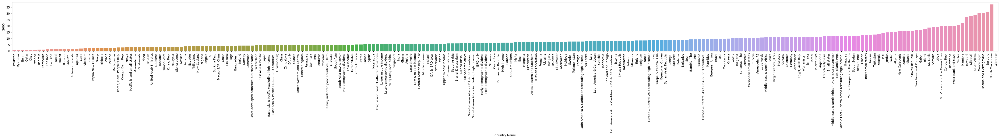

----------- Showing Result of : 2006 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Pakistan,Myanmar,Benin,Qatar,Chad,Rwanda,Tonga,Bahrain,Lao PDR,Cambodia,Thailand,Kuwait,Nepal,Burundi,Vanuatu,Solomon Islands,Cuba,Vietnam,Liberia,Uganda,Papua New Guinea,Ethiopia,Bolivia,Niger,"Korea, Dem. People's Rep.",Iceland,Kenya,United Arab Emirates,Madagascar,Pacific island small states,IDA blend,Mozambique,Guatemala,"Congo, Dem. Rep.",Bhutan,"Korea, Rep.",Tanzania,Malaysia,Norway,Timor-Leste,Ecuador,Honduras,Mexico,Bangladesh,Burkina Faso,Sierra Leone,Panama,Cameroon,"Macao SAR, China",Nigeria,Angola,New Zealand,Denmark,Fiji,Switzerland,IDA total,Philippines,Oman,Peru,Japan,Togo,Least developed countries: UN classification,East Asia & Pacific,East Asia & Pacific (excluding high income),East Asia & Pacific (IDA & IBRD countries),Ireland,China,Singapore,IDA only,Cyprus,United States,Ghana,Africa Western and Central,Zimbabwe,Guinea,Luxembourg,"Hong Kong SAR, China",Australia,North America,Heavily indebted poor countries (HIPC),South Asia (IDA & IBRD),South Asia,Netherlands,Low income,Pre-demographic dividend,Austria,Eritrea,Comoros,Paraguay,Late-demographic dividend,Nicaragua,United Kingdom,Lower middle income,Fragile and conflict affected situations,Samoa,Low & middle income,Middle income,India,IDA & IBRD total,World,Dominican Republic,Central African Republic,Upper middle income,Costa Rica,Channel Islands,Lithuania,Malawi,Estonia,Cote d'Ivoire,Post-demographic dividend,Slovenia,IBRD only,Early-demographic dividend,Uzbekistan,Sub-Saharan Africa,Sub-Saharan Africa (excluding high income),Sub-Saharan Africa (IDA & IBRD countries),Guinea-Bissau,High income,Saudi Arabia,OECD members,Trinidad and Tobago,Canada,Brunei Darussalam,Sri Lanka,El Salvador,Turkmenistan,Azerbaijan,Italy,Malta,Ukraine,Africa Eastern and Southern,Latvia,Russian Federation,Sweden,Latin America & Caribbean (excluding high income),Mongolia,Czechia,Latin America & Caribbean,Romania,Latin America & the Caribbean (IDA & IBRD coun...,Moldova,Guam,Hungary,"Bahamas, The",Indonesia,Portugal,Finland,Kazakhstan,Europe & Central Asia,Europe & Central Asia (excluding high income),Syrian Arab Republic,Belgium,Kyrgyz Republic,Euro area,Belarus,France,Spain,"Venezuela, RB",Europe & Central Asia (IDA & IBRD countries),European Union,Brazil,Iraq,Lebanon,Equatorial Guinea,Turkiye,Barbados,Bulgaria,Greece,Chile,Mauritius,Maldives,Suriname,"Gambia, The",Belize,Caribbean small states,Morocco,Mauritania,Armenia,Senegal,Argentina,Central Europe and the Baltics,Middle East & North Africa,Germany,Jamaica,Virgin Islands (U.S.),Arab World,"Egypt, Arab Rep.",Mali,Guyana,Israel,Cabo Verde,Uruguay,Small states,Middle East & North Africa (IDA & IBRD countries),Puerto Rico,Middle East & North Africa (excluding high inc...,Afghanistan,Croatia,Colombia,"Iran, Islamic Rep.",French Polynesia,Other small states,South Sudan,Algeria,"Yemen, Rep.",Tunisia,Tajikistan,Zambia,Slovak Republic,Georgia,Poland,Jordan,Sudan,New Caledonia,Albania,Haiti,St. Lucia,Sao Tome and Principe,Gabon,Botswana,West Bank and Gaza,Somalia,St. Vincent and the Grenadines,Libya,"Congo, Rep.",Serbia,Namibia,Montenegro,Djibouti,Eswatini,South Africa,Lesotho,Bosnia and Herzegovina,North Ma

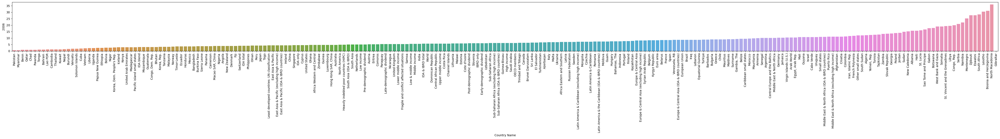

----------- Showing Result of : 2007 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Pakistan,Qatar,Myanmar,Benin,Chad,Rwanda,Bahrain,Lao PDR,Thailand,Tonga,Cambodia,Nepal,Kuwait,Burundi,Cuba,Vanuatu,Solomon Islands,Vietnam,Niger,Liberia,Papua New Guinea,Iceland,Ethiopia,Norway,Bolivia,Uganda,IDA blend,"Korea, Dem. People's Rep.",United Arab Emirates,Kenya,"Korea, Rep.",Tanzania,Pacific island small states,Cameroon,Mozambique,Guatemala,Ecuador,Honduras,Malaysia,Madagascar,"Macao SAR, China",Burkina Faso,"Congo, Dem. Rep.",Timor-Leste,Philippines,Mexico,Switzerland,New Zealand,Panama,Bhutan,Sierra Leone,Denmark,Togo,Angola,Nigeria,Japan,Singapore,Cyprus,"Hong Kong SAR, China",Peru,IDA total,Luxembourg,Fiji,Bangladesh,Netherlands,Oman,Lithuania,East Asia & Pacific,East Asia & Pacific (excluding high income),China,East Asia & Pacific (IDA & IBRD countries),Australia,Least developed countries: UN classification,Costa Rica,Estonia,IDA only,United States,Africa Western and Central,Guinea,Paraguay,North America,Slovenia,Zimbabwe,Ghana,Austria,Heavily indebted poor countries (HIPC),Nicaragua,South Asia,South Asia (IDA & IBRD),Ireland,Uzbekistan,Pre-demographic dividend,Late-demographic dividend,Low income,Moldova,Dominican Republic,Eritrea,United Kingdom,Lower middle income,Czechia,Fragile and conflict affected situations,Samoa,Low & middle income,Middle income,World,Channel Islands,IDA & IBRD total,Upper middle income,Post-demographic dividend,Trinidad and Tobago,India,Central African Republic,High income,Comoros,Saudi Arabia,Turkmenistan,IBRD only,OECD members,Malawi,Early-demographic dividend,Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa,Sub-Saharan Africa (excluding high income),Sri Lanka,Russian Federation,Canada,Latvia,Guinea-Bissau,Italy,Cote d'Ivoire,Sweden,Azerbaijan,Brunei Darussalam,Ukraine,Romania,El Salvador,Malta,Latin America & Caribbean (excluding high income),Africa Eastern and Southern,Latin America & Caribbean,Finland,Bulgaria,Latin America & the Caribbean (IDA & IBRD coun...,Europe & Central Asia,Mongolia,Kazakhstan,"Venezuela, RB",Europe & Central Asia (excluding high income),Barbados,Hungary,Euro area,European Union,Belgium,Europe & Central Asia (IDA & IBRD countries),France,Belarus,Central Europe and the Baltics,"Bahamas, The",Portugal,Indonesia,Kyrgyz Republic,Spain,Guam,Brazil,Greece,Syrian Arab Republic,Chile,Argentina,Mauritius,Belize,Equatorial Guinea,Iraq,Germany,"Egypt, Arab Rep.",Turkiye,Caribbean small states,Lebanon,Suriname,"Gambia, The",Israel,Uruguay,Morocco,Poland,Middle East & North Africa,Jamaica,Armenia,Maldives,Mauritania,Croatia,Arab World,Senegal,Virgin Islands (U.S.),Colombia,Small states,Middle East & North Africa (IDA & IBRD countries),Middle East & North Africa (excluding high inc...,Zambia,Cabo Verde,"Iran, Islamic Rep.",Puerto Rico,Guyana,Slovak Republic,Afghanistan,Other small states,Mali,French Polynesia,South Sudan,Tunisia,Tajikistan,"Yemen, Rep.",Jordan,Georgia,Algeria,St. Lucia,Sudan,New Caledonia,Albania,Sao Tome and Principe,Haiti,Botswana,Serbia,West Bank and Gaza,Gabon,Somalia,St. Vincent and the Grenadines,Libya,Montenegro,"Congo, Rep.",Namibia,South Africa,Djibouti,Eswatini,Bosnia and Herzegovina,Lesotho,North Ma

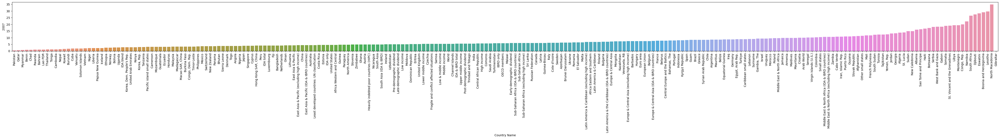

----------- Showing Result of : 2008 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Qatar,Pakistan,Myanmar,Cambodia,Chad,Benin,Lao PDR,Rwanda,Bahrain,Thailand,Nepal,Tonga,Cuba,Burundi,Niger,Kuwait,Vanuatu,Solomon Islands,Vietnam,Liberia,Papua New Guinea,Ethiopia,Norway,Bolivia,United Arab Emirates,Tanzania,"Korea, Dem. People's Rep.",IDA blend,Kenya,Iceland,"Korea, Rep.","Macao SAR, China",Pacific island small states,Mozambique,Uganda,Honduras,Guatemala,Timor-Leste,Malaysia,Togo,Switzerland,Cameroon,Burkina Faso,"Congo, Dem. Rep.","Hong Kong SAR, China",Madagascar,Netherlands,Cyprus,Bhutan,Denmark,Philippines,Panama,Angola,Nigeria,Mexico,Sierra Leone,Ecuador,Singapore,Moldova,Japan,Peru,IDA total,Austria,Oman,Fiji,New Zealand,Australia,East Asia & Pacific,Slovenia,Czechia,Least developed countries: UN classification,Paraguay,East Asia & Pacific (excluding high income),East Asia & Pacific (IDA & IBRD countries),Bangladesh,China,Africa Western and Central,Trinidad and Tobago,IDA only,Guinea,Dominican Republic,Costa Rica,Heavily indebted poor countries (HIPC),South Asia (IDA & IBRD),South Asia,Uzbekistan,Turkmenistan,Pre-demographic dividend,Ghana,Zimbabwe,Late-demographic dividend,Low income,Luxembourg,Saudi Arabia,Lower middle income,Eritrea,Sri Lanka,Low & middle income,Middle income,Fragile and conflict affected situations,IDA & IBRD total,World,India,Estonia,Central African Republic,Upper middle income,Channel Islands,Mongolia,Samoa,Bulgaria,United Kingdom,Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa (excluding high income),Sub-Saharan Africa,IBRD only,Early-demographic dividend,United States,Romania,North America,Lithuania,High income,Azerbaijan,Malawi,Post-demographic dividend,El Salvador,Guinea-Bissau,Comoros,Malta,OECD members,Canada,Nicaragua,Russian Federation,Sweden,"Venezuela, RB",Africa Eastern and Southern,Brunei Darussalam,Latin America & Caribbean (excluding high income),Ukraine,Cote d'Ivoire,Finland,Latin America & Caribbean,Latin America & the Caribbean (IDA & IBRD coun...,Central Europe and the Baltics,Kazakhstan,Italy,Ireland,Belgium,Belarus,France,Europe & Central Asia,Poland,Mauritius,European Union,Indonesia,Europe & Central Asia (IDA & IBRD countries),Brazil,Europe & Central Asia (excluding high income),Euro area,Germany,Portugal,Lebanon,Israel,Latvia,Greece,Hungary,Argentina,Zambia,Uruguay,Barbados,"Bahamas, The",Belize,Kyrgyz Republic,Iraq,Equatorial Guinea,"Egypt, Arab Rep.",Croatia,Guam,Suriname,Caribbean small states,Middle East & North Africa,Chile,"Gambia, The",Slovak Republic,Morocco,Turkiye,Arab World,Mauritania,Small states,Senegal,Middle East & North Africa (IDA & IBRD countries),Virgin Islands (U.S.),Middle East & North Africa (excluding high inc...,Colombia,Mali,Jamaica,"Iran, Islamic Rep.",Cabo Verde,Syrian Arab Republic,Other small states,Maldives,Afghanistan,Spain,Guyana,Algeria,Puerto Rico,French Polynesia,Tajikistan,South Sudan,Tunisia,"Yemen, Rep.",Jordan,St. Lucia,Albania,Serbia,Armenia,New Caledonia,Sudan,Sao Tome and Principe,Haiti,Botswana,Montenegro,Georgia,St. Vincent and the Grenadines,Somalia,Gabon,Libya,"Congo, Rep.",Namibia,South Africa,West Bank and Gaza,Bosnia and Herzegovina,Djibouti,Eswatini,Lesotho,North Ma

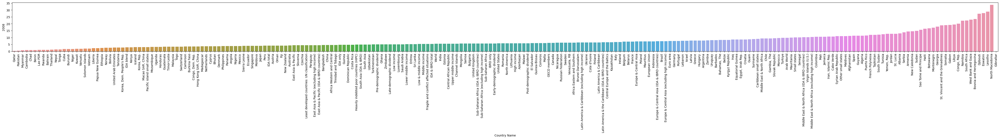

----------- Showing Result of : 2009 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Qatar,Pakistan,Cambodia,Myanmar,Lao PDR,Thailand,Chad,Benin,Rwanda,Bahrain,Niger,Nepal,Burundi,Kuwait,Cuba,Tonga,Vietnam,Vanuatu,Solomon Islands,Papua New Guinea,Liberia,Ethiopia,Tanzania,United Arab Emirates,"Korea, Dem. People's Rep.",IDA blend,Togo,Kenya,Bolivia,Norway,Mozambique,Pacific island small states,Honduras,Timor-Leste,"Korea, Rep.",Guatemala,Burkina Faso,"Macao SAR, China",Uganda,Malaysia,Cameroon,Angola,"Congo, Dem. Rep.",Nigeria,Panama,Philippines,Bhutan,Madagascar,Peru,Turkmenistan,Sierra Leone,Oman,Switzerland,IDA total,Fiji,Netherlands,East Asia & Pacific (excluding high income),East Asia & Pacific (IDA & IBRD countries),East Asia & Pacific,Least developed countries: UN classification,Africa Western and Central,Ecuador,IDA only,China,Guinea,Heavily indebted poor countries (HIPC),Pre-demographic dividend,Low income,Bangladesh,Uzbekistan,South Asia,South Asia (IDA & IBRD),Japan,Zimbabwe,Luxembourg,Lower middle income,Ghana,Eritrea,"Hong Kong SAR, China",Trinidad and Tobago,Austria,Cyprus,Mexico,Saudi Arabia,Fragile and conflict affected situations,Paraguay,Late-demographic dividend,Dominican Republic,Central African Republic,India,Low & middle income,Australia,Middle income,IDA & IBRD total,Sub-Saharan Africa,Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa (excluding high income),Azerbaijan,Samoa,Sri Lanka,Early-demographic dividend,Singapore,Mongolia,Slovenia,Malawi,Guinea-Bissau,Upper middle income,IBRD only,World,Belarus,"Venezuela, RB",Indonesia,New Zealand,Africa Eastern and Southern,Comoros,Lebanon,Moldova,Denmark,Brunei Darussalam,Kazakhstan,Cote d'Ivoire,Czechia,Bulgaria,Romania,Channel Islands,Malta,Iceland,Mauritius,El Salvador,Latin America & Caribbean (excluding high income),Latin America & Caribbean,Latin America & the Caribbean (IDA & IBRD coun...,United Kingdom,Costa Rica,Germany,Uruguay,Italy,Belgium,High income,Post-demographic dividend,Syrian Arab Republic,Nicaragua,Poland,OECD members,Finland,Belize,Russian Federation,Canada,Sweden,Iraq,Kyrgyz Republic,Central Europe and the Baltics,Brazil,Equatorial Guinea,Argentina,Suriname,France,Ukraine,Europe & Central Asia,Europe & Central Asia (IDA & IBRD countries),Morocco,"Egypt, Arab Rep.",European Union,Europe & Central Asia (excluding high income),North America,Croatia,United States,Mali,Guam,"Gambia, The",Arab World,Middle East & North Africa,Portugal,Israel,Euro area,Greece,Mauritania,Barbados,Hungary,Caribbean small states,Algeria,Senegal,Middle East & North Africa (IDA & IBRD countries),Middle East & North Africa (excluding high inc...,Zambia,Cabo Verde,Small states,Colombia,Chile,Afghanistan,Jamaica,Other small states,Tajikistan,Guyana,Virgin Islands (U.S.),Maldives,Slovak Republic,"Iran, Islamic Rep.",South Sudan,French Polynesia,Turkiye,Ireland,"Yemen, Rep.",Jordan,Sudan,Tunisia,Estonia,Albania,Lithuania,New Caledonia,"Bahamas, The",Puerto Rico,Sao Tome and Principe,St. Lucia,Haiti,Serbia,Botswana,Latvia,Spain,Armenia,Somalia,St. Vincent and the Grenadines,Montenegro,Libya,Gabon,"Congo, Rep.",West Bank and Gaza,Georgia,Namibia,South Africa,Bosnia and Herzegovina,Eswatini,Djibouti,Lesotho,North Ma

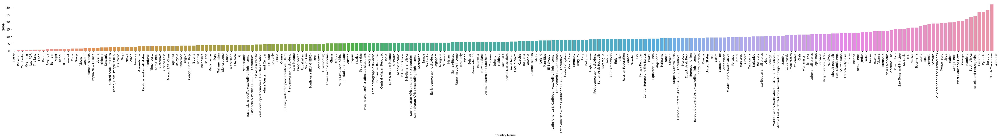

----------- Showing Result of : 2010 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Qatar,Thailand,Pakistan,Lao PDR,Myanmar,Cambodia,Niger,Chad,Benin,Rwanda,Vietnam,Bahrain,Solomon Islands,Burundi,Tonga,Nepal,Kuwait,Vanuatu,Papua New Guinea,Liberia,Ethiopia,Togo,United Arab Emirates,Cuba,Bolivia,"Korea, Dem. People's Rep.",Kenya,"Macao SAR, China",IDA blend,Tanzania,Pacific island small states,Mozambique,Timor-Leste,Bhutan,"Korea, Rep.",Bangladesh,Malaysia,Guatemala,Norway,Peru,Uganda,Philippines,Burkina Faso,Panama,Nigeria,Oman,Turkmenistan,"Congo, Dem. Rep.",Trinidad and Tobago,IDA total,Ecuador,Cameroon,Singapore,Honduras,East Asia & Pacific (excluding high income),East Asia & Pacific (IDA & IBRD countries),Sierra Leone,East Asia & Pacific,Madagascar,Fiji,"Hong Kong SAR, China",Luxembourg,Least developed countries: UN classification,China,Africa Western and Central,Paraguay,IDA only,Guinea,Sri Lanka,Switzerland,Austria,South Asia (IDA & IBRD),South Asia,El Salvador,Netherlands,Lower middle income,Heavily indebted poor countries (HIPC),Japan,Late-demographic dividend,Low income,Zimbabwe,Dominican Republic,Australia,Mexico,Pre-demographic dividend,Low & middle income,Ghana,Middle income,Uzbekistan,IDA & IBRD total,Fragile and conflict affected situations,Eritrea,India,Saudi Arabia,Indonesia,Azerbaijan,Central African Republic,Upper middle income,Early-demographic dividend,Samoa,Kazakhstan,IBRD only,Malawi,World,Sub-Saharan Africa (excluding high income),Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa,Guinea-Bissau,Belarus,Cyprus,Mongolia,New Zealand,Comoros,Latin America & Caribbean (excluding high income),Brunei Darussalam,Latin America & Caribbean,Latin America & the Caribbean (IDA & IBRD coun...,Cote d'Ivoire,Lebanon,Malta,Africa Eastern and Southern,Romania,Germany,"Venezuela, RB",Suriname,Uruguay,Costa Rica,Slovenia,Channel Islands,Brazil,Czechia,Russian Federation,Moldova,Iceland,Mauritius,Argentina,Denmark,United Kingdom,Nicaragua,Canada,Mali,Ukraine,High income,Guam,Belize,Iraq,Post-demographic dividend,Belgium,Italy,Finland,OECD members,Chile,Israel,Europe & Central Asia (excluding high income),Europe & Central Asia (IDA & IBRD countries),Syrian Arab Republic,Sweden,Kyrgyz Republic,"Egypt, Arab Rep.",Equatorial Guinea,France,Europe & Central Asia,Morocco,"Gambia, The",Arab World,Angola,North America,Middle East & North Africa,United States,Poland,European Union,Mauritania,Central Europe and the Baltics,Algeria,Euro area,Senegal,Bulgaria,Caribbean small states,Turkiye,Cabo Verde,Middle East & North Africa (IDA & IBRD countries),Barbados,Portugal,Middle East & North Africa (excluding high inc...,Small states,Tajikistan,Colombia,Hungary,Maldives,Afghanistan,Other small states,Croatia,Virgin Islands (U.S.),Guyana,South Sudan,French Polynesia,Jamaica,Jordan,Greece,"Yemen, Rep.",Tunisia,Zambia,"Iran, Islamic Rep.",New Caledonia,Albania,"Bahamas, The",Slovak Republic,Ireland,Sao Tome and Principe,Sudan,Haiti,Puerto Rico,Estonia,St. Lucia,Lithuania,Botswana,Somalia,Armenia,St. Vincent and the Grenadines,Serbia,Libya,Latvia,Montenegro,Spain,"Congo, Rep.",Georgia,Gabon,West Bank and Gaza,Namibia,South Africa,Eswatini,Djibouti,Lesotho,Bosnia and Herzegovina,North Ma

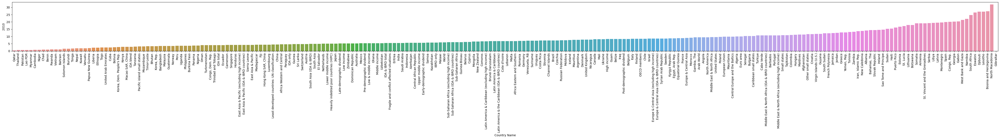

----------- Showing Result of : 2011 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Niger,Qatar,Cambodia,Thailand,Lao PDR,Myanmar,Pakistan,Vietnam,Chad,Rwanda,Bahrain,Solomon Islands,Burundi,Tonga,Vanuatu,Togo,Nepal,Kuwait,Liberia,Bolivia,United Arab Emirates,Ethiopia,Panama,Madagascar,"Macao SAR, China",Papua New Guinea,Benin,"Korea, Dem. People's Rep.",Kenya,IDA blend,"Korea, Rep.",Malaysia,Pacific island small states,Guatemala,Cuba,Norway,Bhutan,Mozambique,"Hong Kong SAR, China",Trinidad and Tobago,Ecuador,Tanzania,Peru,Uganda,Timor-Leste,Philippines,Nigeria,Bangladesh,Burkina Faso,Oman,Singapore,Cameroon,Turkmenistan,East Asia & Pacific (excluding high income),East Asia & Pacific,East Asia & Pacific (IDA & IBRD countries),Sri Lanka,IDA total,"Congo, Dem. Rep.",Sierra Leone,El Salvador,Switzerland,Fiji,Honduras,Least developed countries: UN classification,Africa Western and Central,China,Japan,Austria,IDA only,Paraguay,Mongolia,South Asia,South Asia (IDA & IBRD),Guinea,Luxembourg,Netherlands,Uzbekistan,Lower middle income,Heavily indebted poor countries (HIPC),Late-demographic dividend,Australia,Low income,Indonesia,Mexico,Pre-demographic dividend,Low & middle income,Middle income,IDA & IBRD total,Zimbabwe,Kazakhstan,Azerbaijan,India,Fragile and conflict affected situations,Eritrea,Upper middle income,Early-demographic dividend,Ghana,Central African Republic,IBRD only,Samoa,World,Saudi Arabia,Germany,Malawi,Sub-Saharan Africa (excluding high income),Sub-Saharan Africa,Sub-Saharan Africa (IDA & IBRD countries),Guinea-Bissau,Dominican Republic,Belarus,Uruguay,Malta,Latin America & Caribbean (excluding high income),Latin America & Caribbean,New Zealand,Latin America & the Caribbean (IDA & IBRD coun...,Nicaragua,Russian Federation,Moldova,Czechia,Africa Eastern and Southern,Mali,"Venezuela, RB",Brazil,Brunei Darussalam,Iceland,Comoros,Cote d'Ivoire,Israel,Belgium,Romania,Argentina,Chile,Angola,Lebanon,Mauritius,Channel Islands,Canada,Suriname,Denmark,Finland,Sweden,Europe & Central Asia (excluding high income),Ukraine,Cyprus,High income,Post-demographic dividend,Europe & Central Asia (IDA & IBRD countries),OECD members,United Kingdom,Iraq,Slovenia,Belize,Italy,Kyrgyz Republic,Syrian Arab Republic,Equatorial Guinea,Europe & Central Asia,North America,Turkiye,France,Morocco,United States,"Gambia, The",Poland,Central Europe and the Baltics,European Union,Mauritania,Algeria,Middle East & North Africa,Colombia,Euro area,Costa Rica,Tajikistan,Senegal,Maldives,Arab World,Caribbean small states,Small states,Zambia,Cabo Verde,Hungary,Afghanistan,Other small states,Barbados,Bulgaria,Middle East & North Africa (IDA & IBRD countries),Middle East & North Africa (excluding high inc...,"Egypt, Arab Rep.",Guyana,Virgin Islands (U.S.),South Sudan,French Polynesia,Estonia,"Iran, Islamic Rep.",Portugal,Jamaica,Jordan,"Yemen, Rep.",Guam,Albania,Slovak Republic,Croatia,New Caledonia,Sao Tome and Principe,"Bahamas, The",Haiti,Ireland,Lithuania,Puerto Rico,Latvia,Sudan,West Bank and Gaza,Greece,Tunisia,Botswana,Armenia,St. Lucia,Somalia,St. Vincent and the Grenadines,Libya,Namibia,Georgia,Montenegro,"Congo, Rep.",Gabon,Spain,Serbia,South Africa,Eswatini,Lesotho,Djibouti,Bosnia and Herzegovina,North Ma

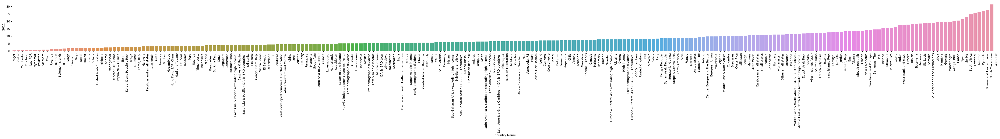

----------- Showing Result of : 2012 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Qatar,Cambodia,Thailand,Madagascar,Lao PDR,Myanmar,Chad,Vietnam,Solomon Islands,Rwanda,Bahrain,Burundi,Pakistan,Vanuatu,"Macao SAR, China",Togo,Bhutan,Tonga,Bolivia,Liberia,Niger,United Arab Emirates,Ethiopia,Kuwait,Nepal,Panama,Benin,Papua New Guinea,Guatemala,"Korea, Dem. People's Rep.","Korea, Rep.",Kenya,Malaysia,Norway,Pacific island small states,Tanzania,Ecuador,Peru,IDA blend,"Hong Kong SAR, China",Mozambique,Cuba,Philippines,Uganda,Oman,Singapore,Trinidad and Tobago,Nigeria,Honduras,Timor-Leste,Cameroon,El Salvador,Sri Lanka,Mongolia,Burkina Faso,East Asia & Pacific (excluding high income),East Asia & Pacific,East Asia & Pacific (IDA & IBRD countries),Turkmenistan,Paraguay,Bangladesh,IDA total,Japan,Sierra Leone,Fiji,Indonesia,Switzerland,"Congo, Dem. Rep.",Least developed countries: UN classification,China,Africa Western and Central,IDA only,Guinea,Austria,Mexico,Uzbekistan,South Asia,South Asia (IDA & IBRD),Heavily indebted poor countries (HIPC),Late-demographic dividend,Lower middle income,Low income,Luxembourg,Zimbabwe,Azerbaijan,Pre-demographic dividend,Nicaragua,Australia,Low & middle income,Middle income,Kazakhstan,IDA & IBRD total,Germany,India,Russian Federation,Upper middle income,Fragile and conflict affected situations,Saudi Arabia,Eritrea,Central African Republic,Early-demographic dividend,Moldova,IBRD only,World,Netherlands,Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa,Sub-Saharan Africa (excluding high income),Guinea-Bissau,Ghana,Malawi,Iceland,Belarus,Malta,Latin America & Caribbean (excluding high income),Latin America & Caribbean,Latin America & the Caribbean (IDA & IBRD coun...,Uruguay,Africa Eastern and Southern,"Venezuela, RB",Mali,Chile,Dominican Republic,Romania,Israel,Brunei Darussalam,New Zealand,Czechia,Brazil,Europe & Central Asia (excluding high income),Argentina,Cote d'Ivoire,Canada,Angola,Comoros,Mauritius,Europe & Central Asia (IDA & IBRD countries),Ukraine,Belgium,Finland,Denmark,Lebanon,Zambia,United Kingdom,High income,Iraq,Sweden,North America,OECD members,Post-demographic dividend,United States,Suriname,Turkiye,Channel Islands,Belize,Kyrgyz Republic,Equatorial Guinea,Samoa,Syrian Arab Republic,Slovenia,Europe & Central Asia,Morocco,France,"Gambia, The",Senegal,Maldives,Tajikistan,Colombia,Costa Rica,Mauritania,Central Europe and the Baltics,Estonia,Poland,Middle East & North Africa,Small states,Italy,Arab World,Other small states,European Union,Algeria,Hungary,Caribbean small states,Cabo Verde,Euro area,Afghanistan,Barbados,Middle East & North Africa (IDA & IBRD countries),Middle East & North Africa (excluding high inc...,Cyprus,South Sudan,Guam,Jordan,French Polynesia,Virgin Islands (U.S.),Bulgaria,"Iran, Islamic Rep.",Guyana,"Egypt, Arab Rep.","Yemen, Rep.",Lithuania,Albania,Sao Tome and Principe,Jamaica,Slovak Republic,"Bahamas, The",Haiti,New Caledonia,Puerto Rico,Latvia,Ireland,Portugal,Croatia,Namibia,Armenia,Sudan,Tunisia,Botswana,St. Vincent and the Grenadines,Somalia,Libya,St. Lucia,West Bank and Gaza,Georgia,Montenegro,"Congo, Rep.",Gabon,Serbia,Greece,South Africa,Spain,Eswatini,Lesotho,Djibouti,Bosnia and Herzegovina,North Ma

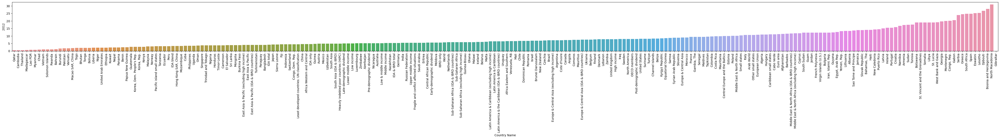

----------- Showing Result of : 2013 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Thailand,Qatar,Cambodia,Solomon Islands,Lao PDR,Myanmar,Madagascar,Chad,Rwanda,Bahrain,Vietnam,Niger,Burundi,"Macao SAR, China",Vanuatu,Uganda,United Arab Emirates,Togo,Liberia,Tonga,Ethiopia,Panama,Benin,Bolivia,Papua New Guinea,Nepal,Kuwait,Trinidad and Tobago,"Korea, Rep.","Korea, Dem. People's Rep.",Kenya,Bhutan,Tanzania,Pakistan,Pacific island small states,Guatemala,Ecuador,Malaysia,Cuba,Mozambique,"Hong Kong SAR, China",Norway,Philippines,Peru,Oman,IDA blend,Cameroon,El Salvador,Nigeria,Singapore,Japan,Timor-Leste,East Asia & Pacific,East Asia & Pacific (excluding high income),Burkina Faso,East Asia & Pacific (IDA & IBRD countries),Turkmenistan,Mongolia,Sri Lanka,Cote d'Ivoire,IDA total,Fiji,Indonesia,Paraguay,Africa Western and Central,Bangladesh,"Congo, Dem. Rep.",Least developed countries: UN classification,Sierra Leone,China,IDA only,Switzerland,Heavily indebted poor countries (HIPC),Guinea,Uzbekistan,Mexico,Low income,Azerbaijan,Zimbabwe,Late-demographic dividend,Lower middle income,Pre-demographic dividend,South Asia,South Asia (IDA & IBRD),Moldova,Kazakhstan,Germany,Low & middle income,Middle income,Nicaragua,IDA & IBRD total,Austria,Iceland,India,Russian Federation,Upper middle income,Central African Republic,Fragile and conflict affected situations,Saudi Arabia,Eritrea,IBRD only,Early-demographic dividend,Honduras,Australia,Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa (excluding high income),Sub-Saharan Africa,World,Guinea-Bissau,New Zealand,Luxembourg,Malawi,Belarus,Malta,Ghana,Chile,Israel,Latin America & Caribbean (excluding high income),Mali,Latin America & Caribbean,Latin America & the Caribbean (IDA & IBRD coun...,Uruguay,Africa Eastern and Southern,Suriname,Brunei Darussalam,Czechia,Brazil,Canada,Argentina,Romania,Ukraine,Europe & Central Asia (excluding high income),Netherlands,Mauritius,North America,Dominican Republic,Angola,United States,Denmark,United Kingdom,"Venezuela, RB",Europe & Central Asia (IDA & IBRD countries),Comoros,High income,OECD members,Post-demographic dividend,Sweden,Finland,Lebanon,Kyrgyz Republic,Belize,Belgium,Equatorial Guinea,Senegal,Zambia,Estonia,Samoa,Maldives,Turkiye,Costa Rica,Syrian Arab Republic,Channel Islands,Tajikistan,Colombia,Europe & Central Asia,Morocco,Iraq,"Gambia, The",Algeria,France,Middle East & North Africa,Mauritania,Central Europe and the Baltics,Slovenia,Hungary,Poland,"Iran, Islamic Rep.",Small states,Arab World,Other small states,Afghanistan,European Union,Cabo Verde,Middle East & North Africa (IDA & IBRD countries),Middle East & North Africa (excluding high inc...,Guam,Barbados,Caribbean small states,Lithuania,Latvia,Euro area,South Sudan,Italy,French Polynesia,Jordan,Guyana,Virgin Islands (U.S.),Bulgaria,"Egypt, Arab Rep.","Yemen, Rep.",Sao Tome and Principe,Ireland,Haiti,Slovak Republic,Puerto Rico,New Caledonia,Jamaica,Cyprus,Albania,Tunisia,Armenia,Portugal,"Bahamas, The",Croatia,Sudan,Somalia,St. Vincent and the Grenadines,Namibia,Botswana,Georgia,Libya,Montenegro,West Bank and Gaza,"Congo, Rep.",Gabon,Serbia,St. Lucia,Eswatini,South Africa,Lesotho,Spain,Djibouti,Greece,Bosnia and Herzegovina,North Ma

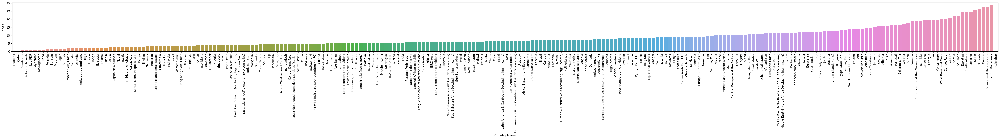

----------- Showing Result of : 2014 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Qatar,Niger,Thailand,Cambodia,Solomon Islands,Myanmar,Lao PDR,Chad,Rwanda,Bahrain,Vietnam,Madagascar,Burundi,"Macao SAR, China",Vanuatu,Pakistan,Uganda,United Arab Emirates,Bolivia,Liberia,Tanzania,Benin,Togo,Ethiopia,Tonga,Papua New Guinea,Trinidad and Tobago,Bhutan,Cuba,Panama,Guatemala,"Korea, Dem. People's Rep.",Kenya,Malaysia,Kuwait,Pacific island small states,Nepal,"Korea, Rep.",Peru,"Hong Kong SAR, China",Mozambique,Norway,Ecuador,IDA blend,Cameroon,Oman,Japan,Philippines,Cote d'Ivoire,Moldova,Singapore,East Asia & Pacific,East Asia & Pacific (excluding high income),East Asia & Pacific (IDA & IBRD countries),Indonesia,Turkmenistan,El Salvador,Burkina Faso,Sri Lanka,Timor-Leste,IDA total,Fiji,Bangladesh,"Congo, Dem. Rep.",Least developed countries: UN classification,Nicaragua,Nigeria,IDA only,China,Sierra Leone,Africa Western and Central,Heavily indebted poor countries (HIPC),Zimbabwe,Mongolia,Mexico,Switzerland,Guinea,Iceland,Azerbaijan,Late-demographic dividend,Low income,South Asia (IDA & IBRD),South Asia,Germany,Lower middle income,Paraguay,Kazakhstan,Uzbekistan,Russian Federation,Pre-demographic dividend,Low & middle income,Middle income,IDA & IBRD total,New Zealand,India,Upper middle income,Central African Republic,IBRD only,Early-demographic dividend,World,Austria,Eritrea,Saudi Arabia,Malta,Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa (excluding high income),Sub-Saharan Africa,Guinea-Bissau,Fragile and conflict affected situations,Luxembourg,Israel,Malawi,Belarus,Australia,Latin America & Caribbean (excluding high income),Czechia,United Kingdom,Latin America & Caribbean,United States,Latin America & the Caribbean (IDA & IBRD coun...,North America,Mali,Africa Eastern and Southern,Ghana,Uruguay,Brazil,Chile,Dominican Republic,Romania,"Venezuela, RB",Canada,Denmark,Suriname,Brunei Darussalam,Honduras,High income,Argentina,Estonia,Angola,OECD members,Netherlands,Post-demographic dividend,Europe & Central Asia (excluding high income),Mauritius,Guam,Senegal,Europe & Central Asia (IDA & IBRD countries),Hungary,Maldives,Sweden,Kyrgyz Republic,Comoros,Tajikistan,Belize,Equatorial Guinea,Belgium,Colombia,Channel Islands,Finland,Samoa,Syrian Arab Republic,Lebanon,Central Europe and the Baltics,Europe & Central Asia,Poland,Costa Rica,Ukraine,Zambia,"Gambia, The",Slovenia,Morocco,Turkiye,Middle East & North Africa,Mauritania,Algeria,France,Small states,Iraq,Other small states,"Iran, Islamic Rep.",Lithuania,Caribbean small states,Latvia,European Union,Arab World,Afghanistan,Bulgaria,Cabo Verde,Middle East & North Africa (IDA & IBRD countries),Euro area,Middle East & North Africa (excluding high inc...,Ireland,Jordan,Barbados,South Sudan,French Polynesia,Italy,Virgin Islands (U.S.),Guyana,"Egypt, Arab Rep.",Slovak Republic,"Yemen, Rep.",Sao Tome and Principe,Jamaica,"Bahamas, The",Portugal,Puerto Rico,Haiti,New Caledonia,Tunisia,Cyprus,Croatia,Sudan,Georgia,Armenia,Montenegro,Albania,Namibia,Somalia,St. Vincent and the Grenadines,Serbia,Libya,Botswana,"Congo, Rep.",West Bank and Gaza,Gabon,St. Lucia,Eswatini,Lesotho,Spain,South Africa,Djibouti,Greece,Bosnia and Herzegovina,North Ma

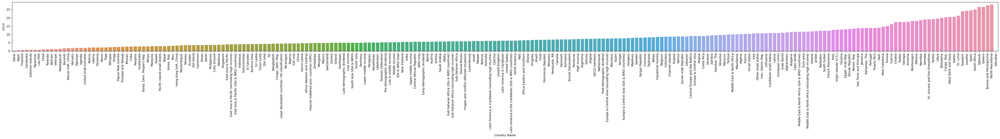

----------- Showing Result of : 2015 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Qatar,Cambodia,Niger,Thailand,Solomon Islands,Myanmar,Lao PDR,Chad,Rwanda,Bahrain,Burundi,United Arab Emirates,Madagascar,"Macao SAR, China",Vietnam,Vanuatu,Uganda,Benin,Liberia,Tanzania,Kuwait,Togo,Ethiopia,Cuba,Trinidad and Tobago,Bhutan,Papua New Guinea,Guatemala,Tonga,"Korea, Dem. People's Rep.",Kenya,Pacific island small states,Panama,Philippines,Nepal,Malaysia,Bolivia,Cote d'Ivoire,Peru,"Hong Kong SAR, China",Oman,Japan,Mozambique,"Korea, Rep.",Cameroon,Pakistan,Ecuador,Singapore,Iceland,El Salvador,IDA blend,East Asia & Pacific,East Asia & Pacific (excluding high income),East Asia & Pacific (IDA & IBRD countries),Turkmenistan,Fiji,Norway,Nigeria,Mexico,Burkina Faso,Bangladesh,IDA total,Timor-Leste,"Congo, Dem. Rep.",Indonesia,Sri Lanka,Least developed countries: UN classification,Paraguay,IDA only,Germany,Africa Western and Central,China,Moldova,Nicaragua,Sierra Leone,Heavily indebted poor countries (HIPC),Zimbabwe,Switzerland,Mongolia,Guinea,Kazakhstan,Azerbaijan,Low income,Czechia,Late-demographic dividend,South Asia (IDA & IBRD),South Asia,Lower middle income,Pre-demographic dividend,Uzbekistan,Israel,United States,United Kingdom,Malta,Low & middle income,New Zealand,Middle income,India,IDA & IBRD total,North America,Russian Federation,Saudi Arabia,Central African Republic,World,Upper middle income,IBRD only,Austria,Early-demographic dividend,Fragile and conflict affected situations,Sub-Saharan Africa,Sub-Saharan Africa (excluding high income),Sub-Saharan Africa (IDA & IBRD countries),Eritrea,Belarus,Malawi,Guinea-Bissau,Australia,"Venezuela, RB",Honduras,Estonia,Denmark,Africa Eastern and Southern,Chile,High income,Latin America & Caribbean,Latin America & Caribbean (excluding high income),Luxembourg,Latin America & the Caribbean (IDA & IBRD coun...,Senegal,Romania,Hungary,Ghana,OECD members,Netherlands,Post-demographic dividend,Guam,Canada,Maldives,Suriname,Angola,Mauritius,Sweden,Uruguay,Poland,Argentina,Tajikistan,Kyrgyz Republic,Belize,Europe & Central Asia (excluding high income),Dominican Republic,Europe & Central Asia (IDA & IBRD countries),Mali,Brunei Darussalam,Central Europe and the Baltics,Comoros,Channel Islands,Colombia,Brazil,Belgium,Samoa,Equatorial Guinea,Europe & Central Asia,Syrian Arab Republic,Slovenia,Costa Rica,Lithuania,Bulgaria,Ukraine,Lebanon,Finland,Morocco,"Gambia, The",Barbados,Latvia,Ireland,European Union,Zambia,Mauritania,Middle East & North Africa,Small states,Turkiye,France,Caribbean small states,Other small states,Iraq,Euro area,Arab World,Afghanistan,"Iran, Islamic Rep.",Algeria,Slovak Republic,Cabo Verde,Middle East & North Africa (IDA & IBRD countries),Italy,Middle East & North Africa (excluding high inc...,"Bahamas, The",Puerto Rico,French Polynesia,South Sudan,Portugal,Virgin Islands (U.S.),"Egypt, Arab Rep.",Jordan,Guyana,Jamaica,"Yemen, Rep.",Sao Tome and Principe,Haiti,New Caledonia,Cyprus,Tunisia,Croatia,Georgia,Albania,Sudan,Montenegro,Serbia,Armenia,Somalia,St. Vincent and the Grenadines,Libya,"Congo, Rep.",St. Lucia,Botswana,Gabon,Namibia,Spain,West Bank and Gaza,Eswatini,Lesotho,Greece,South Africa,North Macedonia,Djibouti,Bosnia and Herz

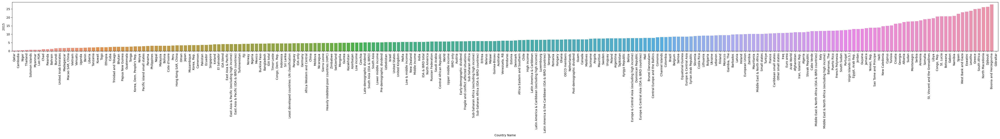

----------- Showing Result of : 2016 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Qatar,Niger,Thailand,Solomon Islands,Cambodia,Lao PDR,Chad,Rwanda,Myanmar,Bahrain,Burundi,United Arab Emirates,Vanuatu,Madagascar,Benin,Vietnam,Uganda,"Macao SAR, China",Cuba,Tanzania,Kuwait,Ethiopia,Papua New Guinea,Bhutan,Tonga,Guatemala,Cote d'Ivoire,Philippines,"Korea, Dem. People's Rep.",Kenya,Pacific island small states,Nepal,Togo,Iceland,Liberia,Japan,Trinidad and Tobago,Panama,Oman,"Hong Kong SAR, China",Malaysia,Mozambique,Bolivia,Cameroon,"Korea, Rep.",Peru,Pakistan,Mexico,Nicaragua,Czechia,East Asia & Pacific,East Asia & Pacific (excluding high income),Moldova,East Asia & Pacific (IDA & IBRD countries),Singapore,Germany,Turkmenistan,Sri Lanka,Indonesia,Fiji,Bangladesh,El Salvador,Burkina Faso,Senegal,"Congo, Dem. Rep.",China,Least developed countries: UN classification,IDA only,Ecuador,Timor-Leste,Sierra Leone,Norway,Malta,IDA total,Heavily indebted poor countries (HIPC),Zimbabwe,Israel,United Kingdom,United States,Guinea,Switzerland,Kazakhstan,Azerbaijan,IDA blend,Low income,North America,Hungary,South Asia,South Asia (IDA & IBRD),New Zealand,Uzbekistan,Late-demographic dividend,Paraguay,Lower middle income,"Venezuela, RB",Guam,India,Ghana,Low & middle income,Russian Federation,Africa Western and Central,IDA & IBRD total,Middle income,Saudi Arabia,Central African Republic,World,Pre-demographic dividend,Australia,Early-demographic dividend,IBRD only,Malawi,Belarus,Romania,Eritrea,Upper middle income,Guinea-Bissau,Denmark,Netherlands,Austria,Maldives,High income,Poland,Sub-Saharan Africa,Sub-Saharan Africa (excluding high income),Sub-Saharan Africa (IDA & IBRD countries),Luxembourg,Fragile and conflict affected situations,Post-demographic dividend,OECD members,Central Europe and the Baltics,Africa Eastern and Southern,Honduras,Chile,Estonia,Mauritius,Tajikistan,Sweden,Canada,Belize,Nigeria,Kyrgyz Republic,Mongolia,Dominican Republic,Angola,Europe & Central Asia (IDA & IBRD countries),Mali,Bulgaria,Europe & Central Asia (excluding high income),Latin America & Caribbean,Channel Islands,Latin America & the Caribbean (IDA & IBRD coun...,Belgium,Uruguay,Lithuania,Latin America & Caribbean (excluding high income),Suriname,Slovenia,Europe & Central Asia,Comoros,Argentina,Barbados,Samoa,Ireland,Brunei Darussalam,Costa Rica,Equatorial Guinea,Colombia,Syrian Arab Republic,Finland,European Union,Morocco,Ukraine,"Gambia, The",Latvia,Slovak Republic,Lebanon,Euro area,France,Algeria,Small states,Middle East & North Africa,Mauritania,Caribbean small states,Other small states,Arab World,Iraq,Turkiye,Zambia,Portugal,Afghanistan,Brazil,Italy,Puerto Rico,Middle East & North Africa (IDA & IBRD countries),Cabo Verde,Middle East & North Africa (excluding high inc...,French Polynesia,South Sudan,"Egypt, Arab Rep.","Iran, Islamic Rep.",Virgin Islands (U.S.),"Bahamas, The",Cyprus,Croatia,Jamaica,"Yemen, Rep.",Guyana,Sao Tome and Principe,Haiti,New Caledonia,Serbia,Jordan,Albania,Tunisia,Georgia,Sudan,Armenia,Montenegro,Somalia,St. Vincent and the Grenadines,Libya,Spain,St. Lucia,"Congo, Rep.",Gabon,Botswana,Eswatini,Namibia,Lesotho,Greece,North Macedonia,West Bank and Gaza,Bosnia and Herzegovina,Djibouti,South

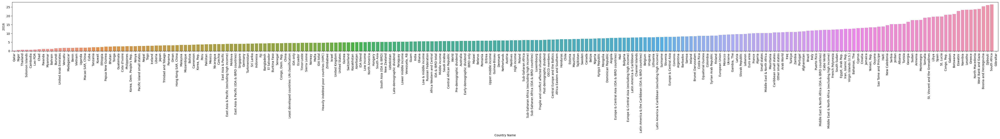

----------- Showing Result of : 2017 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Qatar,Cambodia,Niger,Solomon Islands,Lao PDR,Thailand,Chad,Rwanda,Bahrain,Myanmar,Burundi,Benin,Cuba,Vanuatu,Madagascar,Vietnam,Uganda,"Macao SAR, China",Tanzania,Kuwait,Ethiopia,Bhutan,Guatemala,United Arab Emirates,Papua New Guinea,Philippines,Oman,"Korea, Dem. People's Rep.",Iceland,Japan,Tonga,Pacific island small states,Czechia,Liberia,"Hong Kong SAR, China",Cote d'Ivoire,Trinidad and Tobago,Nicaragua,Nepal,Malaysia,Mexico,Mozambique,Kenya,Cameroon,"Korea, Rep.",Bolivia,Senegal,Peru,Togo,Germany,Ecuador,Panama,East Asia & Pacific,Indonesia,East Asia & Pacific (excluding high income),Pakistan,East Asia & Pacific (IDA & IBRD countries),Malta,Sri Lanka,Moldova,Hungary,Norway,Singapore,Turkmenistan,Ghana,Israel,Fiji,United Kingdom,United States,Bangladesh,El Salvador,China,"Congo, Dem. Rep.",IDA only,Burkina Faso,North America,Least developed countries: UN classification,Paraguay,Heavily indebted poor countries (HIPC),Sierra Leone,New Zealand,Timor-Leste,Zimbabwe,Switzerland,Netherlands,IDA total,Poland,Kazakhstan,Guinea,Romania,Azerbaijan,"Venezuela, RB",Low income,South Asia (IDA & IBRD),South Asia,Russian Federation,Late-demographic dividend,Lower middle income,Central Europe and the Baltics,India,Guam,Austria,Luxembourg,Honduras,Low & middle income,World,IDA & IBRD total,High income,Australia,Middle income,IDA blend,Early-demographic dividend,Central African Republic,Belarus,Estonia,Malawi,IBRD only,Uzbekistan,Denmark,Dominican Republic,Post-demographic dividend,Maldives,Saudi Arabia,OECD members,Upper middle income,Eritrea,Guinea-Bissau,Africa Western and Central,Pre-demographic dividend,Bulgaria,Canada,Mongolia,Sub-Saharan Africa (excluding high income),Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa,Slovenia,Belize,Fragile and conflict affected situations,Ireland,Africa Eastern and Southern,Sweden,Mauritius,Kyrgyz Republic,Tajikistan,Chile,Lithuania,Belgium,Europe & Central Asia (IDA & IBRD countries),Channel Islands,Europe & Central Asia (excluding high income),Angola,Mali,Europe & Central Asia,Uruguay,Suriname,Latin America & Caribbean,Comoros,Latin America & the Caribbean (IDA & IBRD coun...,Slovak Republic,European Union,Costa Rica,Latin America & Caribbean (excluding high income),Argentina,Nigeria,Samoa,Barbados,Finland,Equatorial Guinea,Latvia,Syrian Arab Republic,Colombia,Portugal,Euro area,Morocco,Brunei Darussalam,France,"Gambia, The",Ukraine,Caribbean small states,"Bahamas, The",Small states,Middle East & North Africa,Lebanon,Other small states,Algeria,Mauritania,Puerto Rico,Turkiye,Arab World,Cyprus,Afghanistan,Italy,Croatia,Jamaica,Zambia,"Egypt, Arab Rep.",Middle East & North Africa (IDA & IBRD countries),Middle East & North Africa (excluding high inc...,French Polynesia,"Iran, Islamic Rep.",Cabo Verde,South Sudan,Virgin Islands (U.S.),Brazil,Iraq,"Yemen, Rep.",Serbia,Albania,Guyana,Haiti,Georgia,Sao Tome and Principe,New Caledonia,Tunisia,Montenegro,Spain,Sudan,Armenia,Jordan,St. Lucia,Somalia,St. Vincent and the Grenadines,Libya,Bosnia and Herzegovina,"Congo, Rep.",Gabon,Greece,Botswana,Namibia,North Macedonia,Eswatini,Lesotho,West Bank and Gaza,Djibouti,South

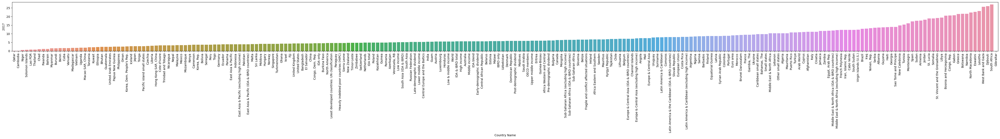

----------- Showing Result of : 2018 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Qatar,Cambodia,Niger,Solomon Islands,Thailand,Lao PDR,Myanmar,Rwanda,Chad,Vietnam,Bahrain,Benin,Burundi,Cuba,Oman,Vanuatu,"Macao SAR, China",Madagascar,Uganda,Kuwait,Tanzania,Czechia,Guatemala,Ethiopia,Philippines,United Arab Emirates,Japan,Bhutan,Papua New Guinea,"Korea, Dem. People's Rep.",Iceland,"Hong Kong SAR, China",Pacific island small states,Liberia,Tonga,Nepal,Senegal,Mexico,Cote d'Ivoire,Malaysia,Trinidad and Tobago,Germany,Mozambique,Peru,Bolivia,Ecuador,Cameroon,Singapore,Malta,Hungary,Togo,East Asia & Pacific,East Asia & Pacific (excluding high income),Norway,East Asia & Pacific (IDA & IBRD countries),"Korea, Rep.",Netherlands,Panama,Poland,United States,United Kingdom,Israel,El Salvador,Pakistan,Moldova,North America,Romania,Turkmenistan,Kenya,Ghana,China,Central Europe and the Baltics,Sri Lanka,New Zealand,Fiji,Indonesia,Bangladesh,"Congo, Dem. Rep.",IDA only,Least developed countries: UN classification,Sierra Leone,Heavily indebted poor countries (HIPC),Burkina Faso,Switzerland,Timor-Leste,Belarus,Zimbabwe,Austria,Kazakhstan,Russian Federation,Azerbaijan,IDA total,Guinea,Late-demographic dividend,"Venezuela, RB",High income,Low income,Slovenia,South Asia,South Asia (IDA & IBRD),Denmark,Nicaragua,Bulgaria,Lower middle income,Post-demographic dividend,Australia,India,Estonia,Mongolia,World,Low & middle income,OECD members,IDA & IBRD total,Middle income,Guam,Luxembourg,Central African Republic,Maldives,IBRD only,Early-demographic dividend,Honduras,Ireland,Malawi,Upper middle income,IDA blend,Canada,Uzbekistan,Dominican Republic,Eritrea,Belgium,Guinea-Bissau,Saudi Arabia,Africa Western and Central,Pre-demographic dividend,Lithuania,Paraguay,Sweden,Mauritius,Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa (excluding high income),Sub-Saharan Africa,Slovak Republic,Fragile and conflict affected situations,Channel Islands,Belize,Europe & Central Asia (IDA & IBRD countries),Africa Eastern and Southern,Kyrgyz Republic,Europe & Central Asia,Portugal,Tajikistan,Europe & Central Asia (excluding high income),Chile,European Union,Finland,Latvia,Angola,Mali,Latin America & Caribbean,Suriname,Latin America & the Caribbean (IDA & IBRD coun...,Latin America & Caribbean (excluding high income),Comoros,Euro area,Barbados,Uruguay,Cyprus,Croatia,Nigeria,Equatorial Guinea,Samoa,Brunei Darussalam,Caribbean small states,Syrian Arab Republic,Ukraine,France,Jamaica,Colombia,Puerto Rico,Argentina,Morocco,Small states,"Gambia, The",Costa Rica,"Egypt, Arab Rep.",Middle East & North Africa,Other small states,"Bahamas, The",Mauritania,Algeria,Arab World,Italy,Lebanon,Turkiye,Afghanistan,Middle East & North Africa (IDA & IBRD countries),Middle East & North Africa (excluding high inc...,Zambia,Cabo Verde,"Iran, Islamic Rep.",South Sudan,French Polynesia,Albania,Brazil,Virgin Islands (U.S.),Georgia,Serbia,Iraq,"Yemen, Rep.",Haiti,Guyana,Sao Tome and Principe,New Caledonia,Montenegro,Spain,Tunisia,Sudan,Jordan,Bosnia and Herzegovina,Somalia,Armenia,St. Lucia,St. Vincent and the Grenadines,Greece,Libya,Namibia,"Congo, Rep.",North Macedonia,Gabon,Botswana,Eswatini,Lesotho,Djibouti,West Bank and Gaza,South

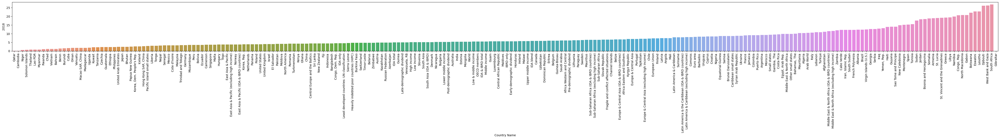

----------- Showing Result of : 2019 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Qatar,Cambodia,Myanmar,Niger,Thailand,Solomon Islands,Lao PDR,Rwanda,Chad,Bahrain,Benin,Burundi,Cuba,"Macao SAR, China",Vanuatu,Oman,Madagascar,Uganda,Czechia,Vietnam,Kuwait,Guatemala,Tanzania,United Arab Emirates,Philippines,Ethiopia,Japan,Papua New Guinea,Bhutan,"Korea, Dem. People's Rep.",Senegal,Pacific island small states,"Hong Kong SAR, China",Liberia,Tonga,Nepal,Singapore,Germany,Malaysia,Poland,Cote d'Ivoire,Peru,Netherlands,Hungary,Trinidad and Tobago,Mozambique,Mexico,Iceland,Pakistan,Malta,Indonesia,Cameroon,United States,Norway,Togo,United Kingdom,"Korea, Rep.",Central Europe and the Baltics,Israel,Ecuador,Bolivia,East Asia & Pacific,North America,East Asia & Pacific (excluding high income),Romania,East Asia & Pacific (IDA & IBRD countries),New Zealand,Belarus,El Salvador,Bulgaria,Turkmenistan,Ghana,Sri Lanka,Switzerland,Bangladesh,Fiji,Slovenia,Estonia,"Congo, Dem. Rep.",Austria,Russian Federation,Timor-Leste,China,IDA only,Least developed countries: UN classification,Sierra Leone,Burkina Faso,Heavily indebted poor countries (HIPC),Panama,High income,Kazakhstan,Zimbabwe,Azerbaijan,IDA total,Ireland,Post-demographic dividend,Kenya,Denmark,Guinea,South Asia (IDA & IBRD),South Asia,Lower middle income,"Venezuela, RB",Moldova,Low income,Late-demographic dividend,Australia,Nicaragua,India,Maldives,World,Belgium,OECD members,Mongolia,Low & middle income,IDA & IBRD total,Guam,Middle income,Early-demographic dividend,Luxembourg,Central African Republic,Canada,IBRD only,Saudi Arabia,Honduras,IDA blend,Slovak Republic,Malawi,Uzbekistan,Eritrea,Upper middle income,Guinea-Bissau,Africa Western and Central,Pre-demographic dividend,Lithuania,Latvia,Mauritius,Dominican Republic,Channel Islands,Portugal,Fragile and conflict affected situations,Paraguay,Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa (excluding high income),Sub-Saharan Africa,Croatia,Europe & Central Asia,Finland,European Union,Belize,Europe & Central Asia (IDA & IBRD countries),Sweden,Africa Eastern and Southern,Kyrgyz Republic,Brunei Darussalam,Tajikistan,Cyprus,Europe & Central Asia (excluding high income),Chile,Angola,Mali,Euro area,Jamaica,"Egypt, Arab Rep.",Latin America & Caribbean,Caribbean small states,Latin America & the Caribbean (IDA & IBRD coun...,Suriname,Comoros,Latin America & Caribbean (excluding high income),Ukraine,Puerto Rico,Samoa,Barbados,France,Nigeria,Equatorial Guinea,Syrian Arab Republic,Uruguay,Small states,Middle East & North Africa,Morocco,"Gambia, The",Other small states,Argentina,Italy,Colombia,Arab World,"Bahamas, The",Serbia,Mauritania,Algeria,Middle East & North Africa (IDA & IBRD countries),"Iran, Islamic Rep.",Middle East & North Africa (excluding high inc...,Afghanistan,Lebanon,Albania,Costa Rica,Georgia,Brazil,Cabo Verde,South Sudan,French Polynesia,Virgin Islands (U.S.),Zambia,Iraq,"Yemen, Rep.",Turkiye,Haiti,Guyana,Spain,Sao Tome and Principe,New Caledonia,Montenegro,Tunisia,St. Lucia,Bosnia and Herzegovina,Jordan,North Macedonia,Greece,Sudan,Armenia,Somalia,St. Vincent and the Grenadines,Libya,Namibia,"Congo, Rep.",Gabon,Lesotho,Botswana,Eswatini,West Bank and Gaza,Djibouti,South

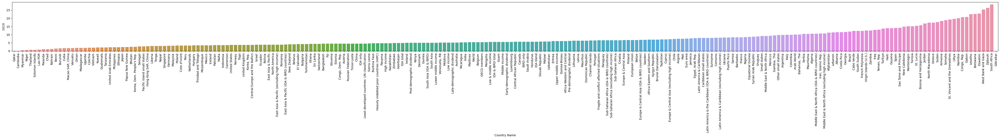

----------- Showing Result of : 2020 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Qatar,Cambodia,Niger,Solomon Islands,Lao PDR,Myanmar,Thailand,Rwanda,Benin,Burundi,Chad,Bahrain,Vanuatu,Vietnam,Madagascar,Philippines,Tanzania,Czechia,"Macao SAR, China",Papua New Guinea,Cuba,Uganda,Japan,"Korea, Dem. People's Rep.",Oman,Pacific island small states,Poland,United Arab Emirates,Ethiopia,Cote d'Ivoire,Kuwait,Guatemala,Senegal,Tonga,Bhutan,Mozambique,Germany,Netherlands,Moldova,Cameroon,"Korea, Rep.",Togo,Liberia,Singapore,Hungary,Malta,Indonesia,Pakistan,East Asia & Pacific,Israel,Central Europe and the Baltics,East Asia & Pacific (excluding high income),East Asia & Pacific (IDA & IBRD countries),Norway,Mexico,United Kingdom,Malaysia,Trinidad and Tobago,New Zealand,Ghana,Fiji,Nepal,Belarus,Switzerland,Kazakhstan,Burkina Faso,Timor-Leste,Turkmenistan,Slovenia,China,Romania,Bulgaria,Sierra Leone,"Congo, Dem. Rep.",IDA only,Least developed countries: UN classification,Zimbabwe,Austria,Bangladesh,Heavily indebted poor countries (HIPC),Iceland,Belgium,Russian Federation,Ireland,Denmark,IDA total,Kenya,"Hong Kong SAR, China",Low income,Sri Lanka,Late-demographic dividend,Nicaragua,Guinea,Ecuador,Dominican Republic,El Salvador,Maldives,Central African Republic,Australia,Azerbaijan,High income,World,Lower middle income,Low & middle income,IDA blend,IDA & IBRD total,"Venezuela, RB",Middle income,Slovak Republic,Malawi,Post-demographic dividend,Guinea-Bissau,Upper middle income,Luxembourg,Africa Western and Central,Portugal,Estonia,Guam,IBRD only,Pre-demographic dividend,Mongolia,Uzbekistan,European Union,OECD members,Early-demographic dividend,Peru,Europe & Central Asia,South Asia,South Asia (IDA & IBRD),Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa (excluding high income),Sub-Saharan Africa,Europe & Central Asia (IDA & IBRD countries),Fragile and conflict affected situations,Mauritius,Saudi Arabia,Croatia,Paraguay,Africa Eastern and Southern,Tajikistan,Cyprus,Brunei Darussalam,Channel Islands,Mali,Finland,Euro area,Eritrea,Bolivia,Europe & Central Asia (excluding high income),India,France,United States,Latvia,North America,Sweden,Angola,Honduras,Belize,Lithuania,Kyrgyz Republic,Puerto Rico,Serbia,Ukraine,Samoa,Italy,"Egypt, Arab Rep.",Comoros,Canada,Jamaica,Nigeria,Suriname,Caribbean small states,Equatorial Guinea,Latin America & Caribbean,Latin America & Caribbean (excluding high income),Latin America & the Caribbean (IDA & IBRD coun...,Syrian Arab Republic,Uruguay,Barbados,Small states,Middle East & North Africa,Other small states,"Gambia, The",Chile,Mauritania,Morocco,Argentina,Arab World,Afghanistan,Middle East & North Africa (IDA & IBRD countries),"Iran, Islamic Rep.",Middle East & North Africa (excluding high inc...,Algeria,Zambia,Panama,Turkiye,Lebanon,"Bahamas, The",Albania,"Yemen, Rep.",Virgin Islands (U.S.),Brazil,South Sudan,Iraq,French Polynesia,Colombia,Bosnia and Herzegovina,Cabo Verde,Haiti,Spain,Sao Tome and Principe,Greece,New Caledonia,Guyana,Tunisia,St. Lucia,North Macedonia,Costa Rica,Montenegro,Georgia,Jordan,Sudan,Somalia,Libya,St. Vincent and the Grenadines,Armenia,Namibia,Gabon,"Congo, Rep.",Lesotho,Botswana,Eswatini,West Bank and Gaza,Djibouti,South

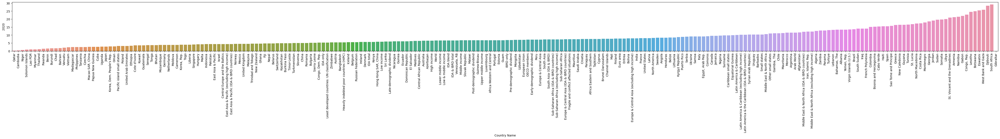

----------- Showing Result of : 2021 --------------


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235
Country Name,Qatar,Cambodia,Niger,Solomon Islands,Lao PDR,Thailand,Benin,Rwanda,Burundi,Bahrain,Chad,Vietnam,Myanmar,Vanuatu,Philippines,"Korea, Dem. People's Rep.",Madagascar,Tanzania,Papua New Guinea,Cuba,Japan,Czechia,Uganda,"Macao SAR, China",Oman,United Arab Emirates,Poland,Pacific island small states,Cote d'Ivoire,Malta,"Korea, Rep.",Germany,Guatemala,Singapore,Ethiopia,Kuwait,Senegal,Cameroon,Moldova,Tonga,Mozambique,Togo,Netherlands,Liberia,Hungary,New Zealand,East Asia & Pacific,East Asia & Pacific (excluding high income),East Asia & Pacific (IDA & IBRD countries),Bhutan,Pakistan,Mexico,Indonesia,Slovenia,Central Europe and the Baltics,United Kingdom,Malaysia,Ghana,Belarus,Burkina Faso,Denmark,Trinidad and Tobago,China,Peru,Kazakhstan,Norway,Russian Federation,Israel,Nepal,Timor-Leste,Turkmenistan,Australia,Romania,Zimbabwe,Luxembourg,Bangladesh,Fiji,"Hong Kong SAR, China",Switzerland,Sierra Leone,Sri Lanka,Iceland,Bulgaria,"Congo, Dem. Rep.",United States,IDA only,Least developed countries: UN classification,Heavily indebted poor countries (HIPC),High income,North America,Kenya,South Asia (IDA & IBRD),South Asia,Late-demographic dividend,Post-demographic dividend,Lower middle income,IDA total,El Salvador,Nicaragua,India,Low income,Maldives,Cyprus,World,Low & middle income,Austria,IDA & IBRD total,Middle income,Estonia,OECD members,Guinea,"Venezuela, RB",Belgium,Ecuador,IBRD only,Early-demographic dividend,Central African Republic,Azerbaijan,Ireland,Portugal,IDA blend,Slovak Republic,Guinea-Bissau,Upper middle income,Africa Western and Central,Guam,Malawi,European Union,Pre-demographic dividend,Mongolia,Europe & Central Asia,Uzbekistan,Paraguay,Europe & Central Asia (IDA & IBRD countries),Saudi Arabia,Channel Islands,Mauritius,Canada,Finland,Latvia,Fragile and conflict affected situations,Brunei Darussalam,Sub-Saharan Africa (IDA & IBRD countries),Sub-Saharan Africa,Sub-Saharan Africa (excluding high income),Mali,Tajikistan,Europe & Central Asia (excluding high income),Euro area,Lithuania,Eritrea,France,Africa Eastern and Southern,Belize,Puerto Rico,Dominican Republic,Bolivia,Honduras,Angola,Sweden,Croatia,Ukraine,Kyrgyz Republic,Chile,Jamaica,Equatorial Guinea,"Egypt, Arab Rep.",Comoros,Caribbean small states,Nigeria,Italy,Samoa,Latin America & Caribbean,Suriname,Latin America & the Caribbean (IDA & IBRD coun...,Latin America & Caribbean (excluding high income),Small states,Barbados,Uruguay,Middle East & North Africa,Syrian Arab Republic,Georgia,Argentina,Other small states,"Gambia, The","Iran, Islamic Rep.",Mauritania,Morocco,Arab World,Serbia,Albania,Middle East & North Africa (IDA & IBRD countries),Panama,Middle East & North Africa (excluding high inc...,Algeria,Zambia,"Bahamas, The",Virgin Islands (U.S.),Afghanistan,Turkiye,"Yemen, Rep.",South Sudan,Iraq,Colombia,French Polynesia,Brazil,Lebanon,Spain,Greece,Bosnia and Herzegovina,Cabo Verde,Haiti,Sao Tome and Principe,North Macedonia,Guyana,New Caledonia,Tunisia,St. Lucia,Costa Rica,Montenegro,Jordan,Libya,Sudan,Somalia,Armenia,St. Vincent and the Grenadines,Namibia,Gabon,"Congo, Rep.",Lesotho,Botswana,West Bank and Gaza,Eswatini,Djibouti,South

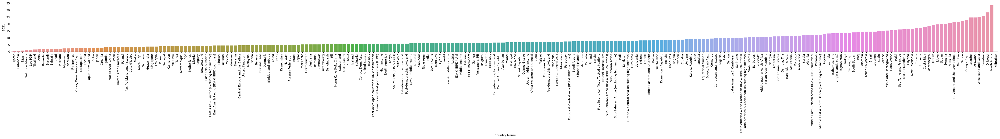

In [33]:
from IPython.display import display
pd.options.display.max_columns = None

for i in data.drop(columns=["Country Name"]):
    print(f"----------- Showing Result of : {i} --------------")
    plt.figure(figsize=(60,3))
    plt.xticks(rotation=90)
    
    temp = data[["Country Name", i]].sort_values(by=i).reset_index().drop(columns=["index"])
    
    sns.barplot(y=temp[i], x="Country Name", data=temp)
    display(temp.transpose())
    plt.show()

In [34]:
def avg_un():
    avg = {}
    
    for c in range(1991, 2022):
        data_value = data[f"{c}"].mean()
        avg[f"{c}"] = data_value
        
    return avg

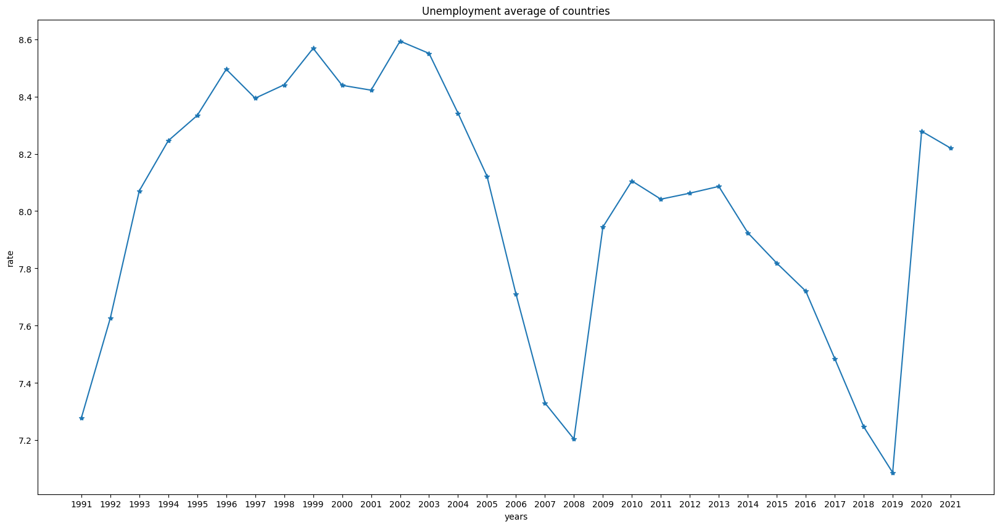

In [35]:
x = avg_un().keys()
y = avg_un().values()

plt.figure(figsize= (20,10))
plt.title("Unemployment average of countries")
plt.xlabel("years")
plt.ylabel("rate")
plt.plot(x, y, marker='*')
plt.show()

In [36]:
def country_rates():
    result = {}
    for i in range(0,235):
        country_rate = data.values[i][2:].mean()
        country_name = data.values[i][:1]
        result[f"{country_name}"] = country_rate
    return result

In [37]:
country_rates()

{"['Africa Eastern and Southern']": 7.226116853666668,
 "['Afghanistan']": 11.157866637666668,
 "['Africa Western and Central']": 4.961552286200001,
 "['Angola']": 5.494066715200001,
 "['Albania']": 16.51776673033333,
 "['Arab World']": 11.334305402566665,
 "['United Arab Emirates']": 2.3614333272666665,
 "['Argentina']": 11.162466700833335,
 "['Armenia']": 13.29999997593333,
 "['Australia']": 6.4177333197,
 "['Austria']": 4.971033342766665,
 "['Azerbaijan']": 6.7825333197,
 "['Burundi']": 1.600800009466667,
 "['Belgium']": 7.6846666018333325,
 "['Benin']": 1.3422333240333333,
 "['Burkina Faso']": 3.474166687266667,
 "['Bangladesh']": 3.8087333441000006,
 "['Bulgaria']": 10.916133339999998,
 "['Bahrain']": 1.1694000044666666,
 "['Bahamas, The']": 11.155866766199999,
 "['Bosnia and Herzegovina']": 24.260800107333335,
 "['Belarus']": 8.991966676566669,
 "['Belize']": 9.512233320499998,
 "['Bolivia']": 3.0802666504999996,
 "['Brazil']": 9.011566670666666,
 "['Barbados']": 11.9093332931666

In [38]:
figure = px.choropleth(color= country_rates().values(), 
                       locations=country_rates().keys(), 
                       locationmode = "country names", 
                       title = 'Unemployment average of countries in 31 years',
                       featureidkey="properties.district",
                       color_continuous_scale=px.colors.sequential.Peach,
                      labels = {'color':'Unemployment Rate ', 'locations':'Country '})
figure.update_layout(margin={"r":0,"t":70,"l":0,"b":0})
figure.update_layout(font= dict(size = 17, family="Verdana"))
figure.show()
